# Práctica final 
## Predicción de precios empleando el dataset de Airbnb: problema de regresión

### Marc Balle Sánchez

#### Librerías extra a instalar en el environment ds-uib

En esta práctica se hace uso de la librería `nltk`. Para su descarga: 
`conda install -c anaconda nltk` con conda
`pip install --user -U nltk` con pip (Macbook)

Librería `category_encoder`. Para su descarga: `conda install -c conda-forge category_encoders` con conda y `pip install category_encoders` con pip.

## Comienzo de la práctica

Se hace una primera carga de las librerías necesarias

In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt 
from sklearn.preprocessing import OneHotEncoder
from scipy import stats

In [2]:
path = './in/airbnb.csv'

df = pd.read_csv(path)
df.head() #chekeo rapido del dataset

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11547,https://www.airbnb.com/rooms/11547,20200919153121,2020-09-21,My home at the beach,"Sun, joy, relax, quality, beach & peace.<br />...",NaN,https://a0.muscache.com/pictures/494126/8c151b...,42942,https://www.airbnb.com/users/show/42942,...,10.0,10.0,10.0,NaN,f,1,1,0,0,0.93
1,100831,https://www.airbnb.com/rooms/100831,20200919153121,2020-09-21,HOUSE IN MALLORCA - WiFi(ET-3045),<b>The space</b><br />House situated in a quie...,NaN,https://a0.muscache.com/pictures/675527/72b329...,529151,https://www.airbnb.com/users/show/529151,...,10.0,10.0,10.0,ETV-3045,t,1,1,0,0,1.47
2,105891,https://www.airbnb.com/rooms/105891,20200919153121,2020-09-20,VILLAGE HOUSE WITH POOL: IDEAL FOR FAMILIES,The house is a street on the outskirts of the ...,The village's population does not reach two th...,https://a0.muscache.com/pictures/1036816/f36ce...,549192,https://www.airbnb.com/users/show/549192,...,10.0,9.0,10.0,ETV/6127,t,2,2,0,0,0.14
3,106833,https://www.airbnb.com/rooms/106833,20200919153121,2020-09-20,Villa with a big pool in Mallorca,<b>The space</b><br />This is a restored old b...,NaN,https://a0.muscache.com/pictures/710218/98134c...,551974,https://www.airbnb.com/users/show/551974,...,10.0,9.0,9.0,ET/1961,f,1,1,0,0,0.09
4,130669,https://www.airbnb.com/rooms/130669,20200919153121,2020-09-20,Room great apartment,Located in a residential neighbourhood and 10m...,"Located in the center of the city, within minu...",https://a0.muscache.com/pictures/866653/58dc48...,643065,https://www.airbnb.com/users/show/643065,...,NaN,NaN,NaN,NaN,t,2,0,2,0,NaN


In [3]:
print(list(df.columns.values))

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 

Se van a eliminar todas aquellas columnas que sean URLs. No aportan información relevante al precio de la casa.

In [4]:
url_names = ['listing_url','picture_url', 'host_url', 'host_thumbnail_url', 'host_picture_url']
df = df.drop(url_names, axis = 1)

In [5]:
df.head()

,id,scrape_id,last_scraped,name,description,neighborhood_overview,host_id,host_name,host_since,host_location,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11547,20200919153121,2020-09-21,My home at the beach,"Sun, joy, relax, quality, beach & peace.<br />...",NaN,42942,Daniel,2009-10-02,"Balearic Islands, Spain",...,10.0,10.0,10.0,NaN,f,1,1,0,0,0.93
1,100831,20200919153121,2020-09-21,HOUSE IN MALLORCA - WiFi(ET-3045),<b>The space</b><br />House situated in a quie...,NaN,529151,Miguel,2011-04-23,Mallorca,...,10.0,10.0,10.0,ETV-3045,t,1,1,0,0,1.47
2,105891,20200919153121,2020-09-20,VILLAGE HOUSE WITH POOL: IDEAL FOR FAMILIES,The house is a street on the outskirts of the ...,The village's population does not reach two th...,549192,Bartomeu,2011-05-01,"Ariany, Balearic Islands, Spain",...,10.0,9.0,10.0,ETV/6127,t,2,2,0,0,0.14
3,106833,20200919153121,2020-09-20,Villa with a big pool in Mallorca,<b>The space</b><br />This is a restored old b...,NaN,551974,Xisco,2011-05-02,"Palma de Mallorca, Balearic Islands, Spain",...,10.0,9.0,9.0,ET/1961,f,1,1,0,0,0.09
4,130669,20200919153121,2020-09-20,Room great apartment,Located in a residential neighbourhood and 10m...,"Located in the center of the city, within minu...",643065,Nick,2011-05-30,"Palma de Mallorca, Balearic Islands, Spain",...,NaN,NaN,NaN,NaN,t,2,0,2,0,NaN


Se prueba a eliminar los NaN bruscamente con un `dropna`
. 

In [6]:
df_no_nan = df.dropna(axis = 0)
df_no_nan.head()

,id,scrape_id,last_scraped,name,description,neighborhood_overview,host_id,host_name,host_since,host_location,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month


Imposible realizar este paso así, ya que se eliminan todas la filas. Se irá variable a variable comprobando sus valores y estudiando las transformaciones necesarias.

### Definición de funciones para el preprocesado de los datos

Se definen una serie de funciones que se emplearán de manera recurrente en el preprocesado de los datos

`comment_to_length` pasa los comentarios a longitud de palabras. Para ello primero elimina todos los signos de puntuación, puntuaciones innecesarias y las llamadas _stopwords_.  De esta forma solo se tiene en cuenta lo esencial del comentario.

In [7]:
def comment_to_length(X, rm, EN, SPA): 
    index_nan = X.loc[pd.isna(X)].index # se guardan las observaciones con NaN
    X = X.astype('str')
    X = X.replace(rm, '', regex = True) #eliminamos símbolos indeseados
    X = X.str.lower() #todo minúsculas
    X = X.str.split()
    X = X.apply(lambda x: [item for item in x if item not in EN]) #se eliminan stopwords en inglés
    X = X.apply(lambda x: [item for item in x if item not in SPA]) #ídem en español
    X = X.str.join(sep = ',') # de lista a str con palabras separadas por ','
    X = X.str.replace('[^\w\s]',' ') # se eliminan los signos de puntuación restantes ('.', ',', ',,')
 #   index_nan = X.str.contains('nan') # se guardan las observaciones con NaN
    X = X.str.split().apply(len) #se calcula la longitud de cada comentario
    X[index_nan] = float("NaN") #se establecen de nuevo como NaN (sino length = 1)
    
    return X

`apply_ohe` aplica el One Hot Encoding

In [8]:
def apply_ohe (X): 
    index_nan = X.loc[pd.isna(X)].index # se guardan los índices donde hay NaN
    X.loc[index_nan] = X[0] #Se asigna un valor cualquiera a las observaciones NaN
    ohe = OneHotEncoder()
    X_ohe = ohe.fit_transform(pd.DataFrame(X)).toarray() #One Hot Encoding
    X_ohe[np.array(index_nan)] = float("NaN") # se reasignan los NaN
    return X_ohe, ohe.categories_

`elements_to_columns` transforma listas de elementos en vectores binarios.

In [9]:
def elements_to_columns (X, amenitie = False, rm_none = True):
    if amenitie:
        X = X.replace(['\[','\]', "'", '"'],'',regex = True)
        names = [elem for obs in X for elem in obs.split(',')]
    else:
        X = X.replace(['\[','\]', ',', "'", '"'],'',regex = True) #se limpian los strings
        names = [elem for obs in X for elem in obs.split()] #se obtienen todos los elementos juntos en una lista
    set_names = set(names) # unique() se los diferentes elementos
    columns = list(set_names) #los transformamos a una lista para acceder a ellos
    if rm_none:
        columns.remove('None') 
    values = np.zeros((X.shape[0], len(columns)))
    for i,x in enumerate(X):  #se crean las columnas con los elementos: 0 -> no elemento, 1 -> si elemento
        for j,elem in enumerate(columns):
            if elem in x: 
                values[i,j] = 1
    return values, columns

`date_to_float` pasa de formato fecha a número float

In [10]:
def date_to_float (X): 
    X = pd.to_datetime(X) #pasamos a formato datetime
    X = X.dt.strftime("%Y%m%d").astype(float) #convertimos a float
    return X

`tf_to_boolean` pasa de las cadenas `t`y `f` a booleanos `True` y `False`

In [11]:
def tf_to_boolean(X):
    return X.replace(['t','f'], [1,0], regex = True)

Se va a probar a inspeccionar columna por columna y ver qué transformaciones se pueden ir realizando. 

In [12]:
colnames = list(df.columns.values)

En primera instancia, solo se inspeccionarán aquellas variables no numéricas

In [13]:
for col in colnames:
    print(df[[col]].dtypes)

id    int64
dtype: object
scrape_id    int64
dtype: object
last_scraped    object
dtype: object
name    object
dtype: object
description    object
dtype: object
neighborhood_overview    object
dtype: object
host_id    int64
dtype: object
host_name    object
dtype: object
host_since    object
dtype: object
host_location    object
dtype: object
host_about    object
dtype: object
host_response_time    object
dtype: object
host_response_rate    object
dtype: object
host_acceptance_rate    object
dtype: object
host_is_superhost    object
dtype: object
host_neighbourhood    object
dtype: object
host_listings_count    float64
dtype: object
host_total_listings_count    float64
dtype: object
host_verifications    object
dtype: object
host_has_profile_pic    object
dtype: object
host_identity_verified    object
dtype: object
neighbourhood    object
dtype: object
neighbourhood_cleansed    object
dtype: object
neighbourhood_group_cleansed    float64
dtype: object
latitude    float64
dtype: object


### `last_scraped`

In [14]:
df[['last_scraped']].head()

,last_scraped
0,2020-09-21
1,2020-09-21
2,2020-09-20
3,2020-09-20
4,2020-09-20


In [15]:
df[['last_scraped']] = date_to_float(df['last_scraped'])

In [16]:
df[['last_scraped']].head()

,last_scraped
0,20200921.0
1,20200921.0
2,20200920.0
3,20200920.0
4,20200920.0


### `name`

In [17]:
df[['name']].head()

,name
0,My home at the beach
1,HOUSE IN MALLORCA - WiFi(ET-3045)
2,VILLAGE HOUSE WITH POOL: IDEAL FOR FAMILIES
3,Villa with a big pool in Mallorca
4,Room great apartment


Como el nombre que se le pone al anuncio no es relevante para el precio, se conisdera eliminarlo. Es más, podría ser confuso ya que hay veces donde se pone un nombre muy prometedor y después quizá el precio es el de una casa normal. Esto último podría dar lugar a confusiones.

In [18]:
df = df.drop('name', axis = 1)

### `description`

In [19]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/MarcBalle/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [20]:
stop_en = stopwords.words('english')
stop_spa = stopwords.words('spanish')

In [21]:
df[['description']].head(10)

,description
0,"Sun, joy, relax, quality, beach & peace.<br />..."
1,<b>The space</b><br />House situated in a quie...
2,The house is a street on the outskirts of the ...
3,<b>The space</b><br />This is a restored old b...
4,Located in a residential neighbourhood and 10m...
5,<b>The space</b><br />38 square meters with ca...
6,<b>The space</b><br />Welcome to our picturesq...
7,This house is located on a mountain and has gr...
8,LOCATION-LOCATION-LOCATION.<br />The penthouse...
9,"<b>The space</b><br />** Please, always check ..."


In [22]:
df['description'].unique();

Se preprocesan los comentarios, dejando únicamente las palabras relevantes, y se calcula su longitud.

In [23]:
rm_list = ['<br />', '<b>', '</b>']
df[['description']] = comment_to_length(df['description'], rm_list, stop_en, stop_spa)

In [24]:
df[['description']].head()

,description
0,72.0
1,73.0
2,109.0
3,95.0
4,86.0


### Experimento fallido
Se intento realizar un hash encoding de los comentarios, pero se vio que era una barbaridad realizarlo. Demasiadas palabras (categorías) para codificar. No sería beneficioso un vector de tales dimensiones en el problema. Si por el contrario se intentase con un vector de dimensión más reducida (se probó 32 bits), habría codificaciones solapadas. También se pensó en algo como un tokenizador, pero era demasiado trabajo para una variable que probablemente no guarde mucha relación con la variable objetivo. 

In [25]:
from category_encoders.hashing import HashingEncoder

he = HashingEncoder(n_components = 32).fit(df[['description']], df[['price']])

In [26]:
X = he.transform(df[['description']])

### `neighborhood_overview`


In [27]:
df[['neighborhood_overview']].head()

,neighborhood_overview
0,NaN
1,NaN
2,The village's population does not reach two th...
3,NaN
4,"Located in the center of the city, within minu..."


In [28]:
df['neighborhood_overview'].unique()

array([nan,
       "The village's population does not reach two thousand inhabitants. They are friendly, hospitable and noble people. Predominantly older people. Only I have a neighbor who is a person that you almost never see. On the same street there is a restaurant serving traditional Mallorcan food where you can go out to eat or order food for you to take home. Every Friday there is an interesting vegetable market of the farmers in the area.",
       'Located in the center of the city, within minutes you shopping, zara, mango, shopping mall, supermarket all. Within 5min walk',
       ...,
       'Picturesque and quaint.. mins from the hustle and bustle of this lovely historic market town',
       "Villa Bonanova is situated in a lovely quiet suburb of Palma . <br />Its a stone's throw away from the shops , the Porto Pi shopping mall is less than a 5 minute walk away . <br />Palma center is also within easy reach , a 30 minute walk or a 10 minute bus ride , taxi about 7 minutes.<br 

In [29]:
df[['neighborhood_overview']] = comment_to_length(df['neighborhood_overview'], rm_list, stop_en, stop_spa)

In [30]:
df[['neighborhood_overview']].head()

,neighborhood_overview
0,NaN
1,NaN
2,38.0
3,NaN
4,15.0


### `host_name`

In [31]:
df[['host_name']].head(10)

,host_name
0,Daniel
1,Miguel
2,Bartomeu
3,Xisco
4,Nick
5,Juan&Luisa
6,Gabriel
7,Marga
8,Farhang
9,Anna


``host_name`` se considera una varible irrelevante para el trabajo. Se elimina.

In [32]:
df = df.drop('host_name', axis = 1)

### `host_since`

In [33]:
df[['host_since']].head(10)

,host_since
0,2009-10-02
1,2011-04-23
2,2011-05-01
3,2011-05-02
4,2011-05-30
5,2011-06-02
6,2011-06-30
7,2011-07-02
8,2015-05-16
9,2011-06-09


In [34]:
df[['host_since']] = date_to_float(df['host_since'])

In [35]:
df[['host_since']].head()

,host_since
0,20091002.0
1,20110423.0
2,20110501.0
3,20110502.0
4,20110530.0


### `host_location`

In [36]:
df[['host_location']].head(10)

,host_location
0,"Balearic Islands, Spain"
1,Mallorca
2,"Ariany, Balearic Islands, Spain"
3,"Palma de Mallorca, Balearic Islands, Spain"
4,"Palma de Mallorca, Balearic Islands, Spain"
5,"Palma de Mallorca, Balearic Islands, Spain"
6,"Inca, Balearic Islands, Spain"
7,"Palma de Mallorca, Balearic Islands, Spain"
8,"Portals Nous, Illes Balears, Spain"
9,"Palma de Mallorca, Balearic Islands, Spain"


In [37]:
df[['host_location']].tail(10)

,host_location
17598,England
17599,FR
17600,ES
17601,DE
17602,FR
17603,"Av. Príncipes de España 4A, Alcudia, 07400 Is..."
17604,DE
17605,"Muro, Illes Balears, Spain"
17606,"Port d'Andratx, Illes Balears, Spain"
17607,ES


La localización del propietario parece una variable un poco complicada de codificar, ya que el formato en el cual aparecen concretadas las ciudades difiere entre observaciones. Además, se considera que dicha variable no guardará gran relación con el precio final de la casa. Por ello, se procede a eliminarla. 

In [38]:
df = df.drop('host_location', axis = 1)

### `host_about`

In [39]:
df[['host_about']].head(10)

,host_about
0,.
1,Somos una pareja con los mismos gustos e inter...
2,Hola!. Resido en una casa de campo de un puebl...
3,I'm Xisco. I love Mallorcan way of life.
4,NaN
5,\r\nAirBnB initial idea still exists at Juan a...
6,Mi profesión es fotógrafo y mis aficiones son:...
7,NaN
8,Young in spirit. Open in mind..clean in heart...
9,I am Italian and I have been living in Palma d...


La variable `host_about` guarda una pequeña descripción acerca del propietario de la casa. Si se codificase, se le aplicaría la función `comment_to_length`. Sin embargo, se considera una variable irrelevante para el precio de una casa. Se procede a eliminarla. 

In [40]:
df = df.drop('host_about', axis = 1)

### `host_response_time`

In [41]:
df[['host_response_time']].head(10)

,host_response_time
0,within an hour
1,NaN
2,within a few hours
3,within a day
4,within a day
5,NaN
6,within an hour
7,NaN
8,NaN
9,within a few hours


In [42]:
df[['host_response_time']].tail()

,host_response_time
17603,within an hour
17604,within a few hours
17605,within a day
17606,NaN
17607,within an hour


In [43]:
df['host_response_time'].unique()

array(['within an hour', nan, 'within a few hours', 'within a day',
       'a few days or more'], dtype=object)

In [44]:
host_response_time_ohe, host_response_time_ohe_cat = apply_ohe(df['host_response_time'])

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [45]:
host_response_time_ohe, host_response_time_ohe_cat

(array([[ 0.,  0.,  0.,  1.],
        [nan, nan, nan, nan],
        [ 0.,  0.,  1.,  0.],
        ...,
        [ 0.,  1.,  0.,  0.],
        [nan, nan, nan, nan],
        [ 0.,  0.,  0.,  1.]]),
 [array(['a few days or more', 'within a day', 'within a few hours',
         'within an hour'], dtype=object)])

In [46]:
host_response_time_df = pd.DataFrame(data= host_response_time_ohe, columns=["host_response_time_OHE1", "host_response_time_OHE2", "host_response_time_OHE3", "host_response_time_OHE4"])
host_response_time_df.head()

,host_response_time_OHE1,host_response_time_OHE2,host_response_time_OHE3,host_response_time_OHE4
0,0.0,0.0,0.0,1.0
1,NaN,NaN,NaN,NaN
2,0.0,0.0,1.0,0.0
3,0.0,1.0,0.0,0.0
4,0.0,1.0,0.0,0.0


In [47]:
df = df.drop('host_response_time', axis = 1)

### `host_response_rate`

In [48]:
df[['host_response_rate']].head(10)

,host_response_rate
0,100%
1,NaN
2,100%
3,100%
4,100%
5,NaN
6,100%
7,NaN
8,NaN
9,100%


In [49]:
df['host_response_rate'].unique()

array(['100%', nan, '86%', '90%', '0%', '80%', '75%', '89%', '50%', '60%',
       '67%', '20%', '70%', '88%', '33%', '83%', '93%', '91%', '25%',
       '94%', '63%', '97%', '59%', '73%', '95%', '29%', '30%', '78%',
       '92%', '43%', '96%', '99%', '40%', '44%', '22%', '85%', '98%',
       '64%', '35%', '41%', '48%', '82%', '10%', '57%', '77%', '13%',
       '76%', '81%', '87%', '74%'], dtype=object)

In [50]:
df['host_response_rate'] = df['host_response_rate'].replace('%', '', regex = True).astype(float)

In [51]:
df['host_response_rate'].head()

0    100.0
1      NaN
2    100.0
3    100.0
4    100.0
Name: host_response_rate, dtype: float64

In [52]:
index_nan = pd.isna(df['host_response_rate'])
df['host_response_rate'].loc[np.logical_not(index_nan)] = df['host_response_rate'].loc[np.logical_not(index_nan)].apply(lambda x: x/100)
df['host_response_rate'].head()              

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


0    1.0
1    NaN
2    1.0
3    1.0
4    1.0
Name: host_response_rate, dtype: float64

### `host_acceptance_rate`

In [53]:
df[['host_acceptance_rate']].head()

,host_acceptance_rate
0,96%
1,100%
2,83%
3,NaN
4,NaN


In [54]:
df['host_acceptance_rate'] = df['host_acceptance_rate'].replace('%', '', regex = True).astype(float)
index_nan = pd.isna(df['host_acceptance_rate'])
df['host_acceptance_rate'].loc[np.logical_not(index_nan)] = df['host_acceptance_rate'].loc[np.logical_not(index_nan)].apply(lambda x: x/100)
df['host_acceptance_rate'].head() 

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


0    0.96
1    1.00
2    0.83
3     NaN
4     NaN
Name: host_acceptance_rate, dtype: float64

### `host_is_superhost` 

In [55]:
df[['host_is_superhost']].head()

,host_is_superhost
0,f
1,f
2,t
3,f
4,f


In [56]:
df['host_is_superhost'] = tf_to_boolean(df['host_is_superhost'])

In [57]:
df['host_is_superhost'].head()

0    0.0
1    0.0
2    1.0
3    0.0
4    0.0
Name: host_is_superhost, dtype: float64

### `host_neighbourhood`

In [58]:
df[['host_neighbourhood']].head(20)

,host_neighbourhood
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
5,NaN
6,NaN
7,NaN
8,NaN
9,NaN


In [59]:
df['host_neighbourhood'].unique()

array([nan, 'Grachtengordel', 'Untergiesing - Harlaching',
       'La Maternitat i Sant Ramon', 'Monaco',
       "L'Antiga Esquerra de l'Eixample", 'Camins al Grau',
       'Alamo Square', 'Invalides - Ecole Militaire', 'Sant Antoni',
       'Alt Moosach', 'Acacias', 'El Poble-sec', 'Neukölln', 'Kensington',
       'Louvre - Tuileries', 'Downtown Montreal', 'Eimsbüttel', 'Mitte',
       'La Barceloneta', 'Barra da Tijuca', 'Copacabana',
       'Urbanización Carrascosilla', 'Dalston', 'Bastille',
       'Palais Royal', 'Urbanització Can Porquer',
       'Tour Eiffel - Champ de Mars', 'Malasaña',
       'Notre Dame - Ile de La Cité', 'Parque Chacabuco',
       'Charlottenburg', 'Zona 5', 'Oud-Zuid', 'LB of Brent',
       'Urbanització la Font', 'Doral', 'Albany', 'Cortes', 'De Pijp',
       'Vedado', 'Friedrichshagen', 'La Sagrada Família', 'El Oulfa',
       'Vaugirard', 'Parione', 'La Vila Olímpica', 'Pankow', 'Battersea',
       'Newport Beach', 'Antibes', 'Wandsworth', 'Extramurs',
 

`host_neighbourhood` es una variable categórica que representa el barrio donde vive el propietario. Parece una variable categórica con muchos niveles. Además se considera que su implicación en el precio final de la casa es irrelevante. Se procede a eliminarla.

In [60]:
df = df.drop('host_neighbourhood', axis = 1)

### `host_verifications`

In [61]:
df[['host_verifications']].head()

,host_verifications
0,"['email', 'phone', 'reviews', 'jumio', 'govern..."
1,"['email', 'phone', 'facebook', 'reviews', 'jum..."
2,"['email', 'phone', 'facebook', 'reviews', 'jum..."
3,"['email', 'phone', 'reviews', 'jumio', 'offlin..."
4,"['email', 'phone', 'reviews']"


In [62]:
df['host_verifications'].unique();

In [63]:
values, column_names = elements_to_columns(df['host_verifications'])

In [64]:
values, column_names

(array([[0., 0., 0., ..., 0., 1., 1.],
        [0., 1., 0., ..., 0., 1., 1.],
        [0., 1., 1., ..., 0., 1., 1.],
        ...,
        [0., 0., 0., ..., 0., 1., 1.],
        [0., 0., 0., ..., 0., 1., 1.],
        [0., 0., 0., ..., 0., 1., 1.]]),
 ['manual_offline',
  'facebook',
  'identity_manual',
  'work_email',
  'sent_id',
  'manual_online',
  'jumio',
  'offline_government_id',
  'government_id',
  'kba',
  'reviews',
  'google',
  'selfie',
  'zhima_selfie',
  'phone',
  'email'])

In [65]:
host_verifications_df = pd.DataFrame(data = values, columns = column_names)
host_verifications_df.head()

,manual_offline,facebook,identity_manual,work_email,sent_id,manual_online,jumio,offline_government_id,government_id,kba,reviews,google,selfie,zhima_selfie,phone,email
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
2,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0


In [66]:
df = df.drop('host_verifications', axis = 1)

### `host_has_profile_pic`

In [67]:
df[['host_has_profile_pic']].head()

,host_has_profile_pic
0,t
1,t
2,t
3,t
4,t


In [68]:
df['host_has_profile_pic'] = tf_to_boolean(df['host_has_profile_pic'])
df['host_has_profile_pic'].head()

0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: host_has_profile_pic, dtype: float64

Mantiene los NaN

### `host_identity_verified`

In [69]:
df[['host_identity_verified']].head()

,host_identity_verified
0,t
1,t
2,t
3,t
4,f


In [70]:
df['host_identity_verified'] = tf_to_boolean(df['host_identity_verified'])
df['host_identity_verified'].head()

0    1.0
1    1.0
2    1.0
3    1.0
4    0.0
Name: host_identity_verified, dtype: float64

### `neighbourhood`

`neighbourhood` es una variable con bastantes categorías. Sin embargo, con algunas transformaciones, se llega a algo más o menos posible de codificar. Se dejará en el aire por si se necesita después. 

In [71]:
df[['neighbourhood']].head(20)

,neighbourhood
0,NaN
1,NaN
2,"Maria de la Salut, Balearic Islands, Spain"
3,NaN
4,"Palma de Mallorca, PM, Spain"
5,"Palma de Mallorca, Balearic Islands, Spain"
6,NaN
7,NaN
8,"Palma de Mallorca, Balearic Islands, Spain"
9,NaN


In [72]:
df[['neighbourhood']].tail(20)

,neighbourhood
17588,NaN
17589,NaN
17590,NaN
17591,NaN
17592,NaN
17593,"Illes Balears, Spain"
17594,NaN
17595,"Torrenova, Illes Balears, Spain"
17596,"Torrenova, Illes Balears, Spain"
17597,"Pollença, Illes Balears, Spain"


Se observa que por lo general el primer nombre es el nombre del barrio. Como hay muchos, se va a probar quedarse con el primer nombre únicamente. De esta forma, se intenta reducir el nombre de barrios repetidos que aparecen como distintas categorías por las palabras que siguen a sus nombres (Islas Baleares, Mallorca, España, etc.)

In [73]:
df['neighbourhood'].unique().shape

(1033,)

In [74]:
df['neighbourhood'] = df['neighbourhood'].astype('str')

In [75]:
#X = pd.DataFrame(df['neighbourhood'].apply(lambda x : x.rpartition(',')))
df['neighbourhood']  = pd.DataFrame(df['neighbourhood'].apply(lambda x: x.split(',')))
df[['neighbourhood']] .head()

,neighbourhood
0,[nan]
1,[nan]
2,"[Maria de la Salut, Balearic Islands, Spain]"
3,[nan]
4,"[Palma de Mallorca, PM, Spain]"


In [76]:
df[['neighbourhood']] = df[['neighbourhood']].apply(lambda x: [y[0] for y in x])

In [77]:
df[['neighbourhood']].head()

,neighbourhood
0,nan
1,nan
2,Maria de la Salut
3,nan
4,Palma de Mallorca


Se observa que se reduce drásticamente el número de poblaciones distintas cuando se elimina la información respectiva a la comunidad autónoma o país. Aún así, siguen siendo muchas. 

In [78]:
df['neighbourhood'].unique().shape

(441,)

Con tal de evitar que aparezca una misma localidad repetida por diferir en aspectos como un acento o alguna mayúscula, se pasarán todos los nombres a minúscula y se eliminarán los acentos.

In [79]:
df['neighbourhood'] = df['neighbourhood'].str.lower()
df['neighbourhood'].head()

0                  nan
1                  nan
2    maria de la salut
3                  nan
4    palma de mallorca
Name: neighbourhood, dtype: object

In [80]:
accents = ['á','à','é','è','í','ì','ó','ò','ú','ù'] #,'Á','À','É','È','Í','Ì','Ó','Ò', 'Ú', 'Ù']
replacement = ['a','a','e','e','i','i','o','o','u','u'] #,'Á','À','É','È','Í','Ì','Ó','Ò', 'Ú', 'Ù']
df['neighbourhood'] = df['neighbourhood'].replace(accents, replacement, regex=True)
df[['neighbourhood']].head(10)

,neighbourhood
0,nan
1,nan
2,maria de la salut
3,nan
4,palma de mallorca
5,palma de mallorca
6,nan
7,nan
8,palma de mallorca
9,nan


Se comprueba que se ha conseguido reducir un poco el número de localidades repetidas por diferencias ortográficas. Quitando los valores NaN, queda un total de 372 localidades distintas. Aún así, seguro que aún quedan localidades repetidas por diferencias más sútiles que acentos o mayúsculas. 

In [81]:
df['neighbourhood'].unique().shape

(373,)

Para codificarla, se probará un **Hash Encoding**. Para ello se hará uso de la librería `category_encoders.hashing` y su función `HashingEncoder`. Antes de todo, deben sustituirse los NaNs por valores válidos cualquiera. Posteriormente, una vez hecha la transformación, se volverían a introducir. 

In [82]:
df['neighbourhood'] = df['neighbourhood'].replace('nan', float("NaN"), regex = True)
df[['neighbourhood']].head()
index_nan = df.loc[pd.isna(df['neighbourhood']), :].index
df['neighbourhood'].loc[index_nan] = df['neighbourhood'][2]
df['neighbourhood'].head()

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


0    maria de la salut
1    maria de la salut
2    maria de la salut
3    maria de la salut
4    palma de mallorca
Name: neighbourhood, dtype: object

Al tratarse de una variable con muchos niveles, se emplearán 32 dimensiones para el vector final. 

In [83]:
from category_encoders.hashing import HashingEncoder

he = HashingEncoder(n_components=32).fit(df[['neighbourhood']])

In [84]:
X = he.transform(df[['neighbourhood']])

**Problema**: El Hash Encoding no parece estar funcionando. Solo coloca un 1 por cada observación y el resto son 0s. No parece un problema de colisión, ya que sería mucha casualidad que todas las palabras de cada frase, una vez se le ha asignado un entero con una función de hash determinada y se haya dividido dicho entero por 32, obtuvieran el mismo indice en el vector. 

In [85]:
X.head()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,...,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [86]:
X.tail()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,...,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31
17603,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17604,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17605,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17606,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17607,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Aquí se comprueba matemáticamente que solamente hay un 1 por cada vector. La suma de todos los vectores es igual al número de filas menos uno ( _zero indexing_ )

In [87]:
X.sum(axis = 1).sum()

17608

**Solución**: Posteriormente se aprecia que la siguiente variable represente lo mismo que la anterior, pero está mucho más limpia y con muchos menos valores nulos. Como consecuencia, el número de localidades diferentes desciende a un valor normal y lógico. Es por ello que se empleará esta variable en el problema. 

In [88]:
df = df.drop('neighbourhood', axis = 1)

### `neighbourhood_cleansed`

Se sabe que esta variable representa lo mismo que `neighbourhood` porque sus valores coinciden. 

In [89]:
df[['neighbourhood_cleansed']].head(20)

,neighbourhood_cleansed
0,Calvià
1,Santa Margalida
2,Maria de la Salut
3,Sant Llorenç des Cardassar
4,Palma de Mallorca
5,Palma de Mallorca
6,Selva
7,Esporles
8,Palma de Mallorca
9,Palma de Mallorca


In [90]:
df['neighbourhood_cleansed'].unique().shape

(53,)

Dentro de lo cabe, es una variable con u número moderado de factores. Lo recomendable sería aplicar un Hash Encoding. Sin embargo, como este no se ha conseguido aplicar con éxito, se realizará un One Hot Encoding, anque esto suponga la incorporación de más columnas o dimensiones. 

In [91]:
neighbourhood_cleansed_ohe, neighbourhood_cleansed_cat = apply_ohe(df['neighbourhood_cleansed'])

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [92]:
neighbourhood_cleansed_ohe, neighbourhood_cleansed_cat

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 [array(['Alaró', 'Alcúdia', 'Algaida', 'Andratx', 'Ariany', 'Artà',
         'Banyalbufar', 'Binissalem', 'Bunyola', 'Búger', 'Calvià',
         'Campanet', 'Campos', 'Capdepera', 'Consell', 'Costitx', 'Deyá',
         'Escorca', 'Esporles', 'Estellencs', 'Felanitx', 'Fornalutx',
         'Inca', 'Lloret de Vistalegre', 'Lloseta', 'Llubí', 'Llucmajor',
         'Manacor', 'Mancor de la Vall', 'Maria de la Salut', 'Marratxí',
         'Montuïri', 'Muro', 'Palma de Mallorca', 'Petra', 'Pollença',
         'Porreres', 'Puigpunyent', 'Sa Pobla', 'Sant Joan',
         'Sant Llorenç des Cardassar', 'Santa Eugènia', 'Santa Margalida',
         'Santa María del Camí', 'Santanyí', 'Selva', 'Sencelles',
         'Ses Salines', 'Sineu', 'Son Servera',

In [93]:
neighbourhood_cleansed_df = pd.DataFrame(data = neighbourhood_cleansed_ohe, columns = neighbourhood_cleansed_cat)
neighbourhood_cleansed_df.tail()

,Alaró,Alcúdia,Algaida,Andratx,Ariany,Artà,Banyalbufar,Binissalem,Bunyola,Búger,...,Santa María del Camí,Santanyí,Selva,Sencelles,Ses Salines,Sineu,Son Servera,Sóller,Valldemossa,Vilafranc de Bonany
17603,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17605,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17606,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17607,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Tal y como se esperaba del OHE, se crean muchas columnas con valor 0. 

In [94]:
df = df.drop('neighbourhood_cleansed', axis = 1)

### `property_type`

`property_type` podría aplicarse un OHE, pero quizás demasiado tocho. Un Hash Encoding sería más adecuado. 

In [95]:
df[['property_type']].head(10)

,property_type
0,Entire apartment
1,Entire house
2,Entire townhouse
3,Entire villa
4,Private room in apartment
5,Entire guesthouse
6,Entire villa
7,Entire house
8,Private room in guest suite
9,Private room in apartment


`property_type` vuelve a ser de nuevo una variable categórica con un número considerable de factores. Sería más adecuado aplicarle la técnica de Hash Encoding. Pero por lo mismo motivos que con la variable anterior, se aplicará OHE. 

In [96]:
df['property_type'].unique().shape

(74,)

In [97]:
property_type_ohe, property_type_cats = apply_ohe(df['property_type'])

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [98]:
property_type_ohe_df = pd.DataFrame(data = property_type_ohe, columns = property_type_cats)
property_type_ohe_df.tail()

,Barn,Boat,Camper/RV,Casa particular,Castle,Cave,Dome house,Earth house,Entire apartment,Entire bed and breakfast,...,Shared room in apartment,Shared room in bed and breakfast,Shared room in condominium,Shared room in farm stay,Shared room in guesthouse,Shared room in house,Shared room in igloo,Shared room in townhouse,Tiny house,Windmill
17603,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17605,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17606,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17607,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [99]:
df = df.drop('property_type', axis = 1)

### `room_type`

In [100]:
df[['room_type']].head(10)

,room_type
0,Entire home/apt
1,Entire home/apt
2,Entire home/apt
3,Entire home/apt
4,Private room
5,Entire home/apt
6,Entire home/apt
7,Entire home/apt
8,Private room
9,Private room


Esta variable sí que es más apta para aplicar OHE ya que solo tiene 4 niveles.

In [101]:
df['room_type'].unique().shape

(4,)

In [102]:
room_type_ohe, room_type_cats = apply_ohe(df['room_type'])
room_type_df = pd.DataFrame (data = room_type_ohe, columns = room_type_cats)

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [103]:
room_type_df.head()

,Entire home/apt,Hotel room,Private room,Shared room
0,1.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0
4,0.0,0.0,1.0,0.0


In [104]:
df = df.drop('room_type', axis = 1)

### `bathrooms_text` 

In [105]:
df[['bathrooms_text']].head(10)

,bathrooms_text
0,1 bath
1,3 baths
2,2 baths
3,1 bath
4,1 bath
5,1 bath
6,1 bath
7,2 baths
8,1 private bath
9,0 baths


Dada la estructura de esta variable, lo más sencillo y viable sería quedarse con el primer dígito, el cual indica el número de baños presentes. Es cierto que hay palabras clave como _private_ que probablemente tengan una relación con el precio. Sin embargo, la complejidad de la codificación es mayor, y para este problema se considera que lo mejor es únicamente la primera opción. 

In [106]:
df['bathrooms_text'].unique()

array(['1 bath', '3 baths', '2 baths', '1 private bath', '0 baths',
       '1.5 baths', '2 shared baths', '7 baths', '4.5 baths', '2.5 baths',
       '4 baths', '5 baths', 'Shared half-bath', '1.5 shared baths',
       '3.5 baths', '1 shared bath', '6 baths', '8 baths', nan,
       '6.5 baths', '9.5 baths', '5.5 baths', '7.5 baths',
       '12 shared baths', '4 shared baths', '8.5 baths', '0 shared baths',
       '2.5 shared baths', 'Half-bath', '12 baths', '11 baths',
       '13 baths', '9 baths', '3 shared baths', '3.5 shared baths',
       '12.5 baths', '32 baths', '19 baths', 'Private half-bath',
       '13 shared baths', '10 baths', '14 baths', '16 baths'],
      dtype=object)

Como puede apreciarse, existen opciones donde no se da un número, sino que se indica con una palabra como _half_. Esto tendrá que se considerado en la codificación. Para ello, como todos los casos de este tipo expresan el número de baños con la palabra _half_, basta asignar 0.5.

In [107]:
def catch_number(x):
    numbers = np.linspace(0,32, num = 32*2+1) #posibles números de baños, desde 0 a 32 con step = 0.5
    num_str = ' '.join([str(elem) for elem in numbers])
    if x[0] in num_str:
        return float(x[0]) #número de baños
    else: 
        return 0.5 # número de baño = half = 0.5
    
df['bathrooms_text'] = df['bathrooms_text'].astype('str')
df['bathrooms_text'] = df['bathrooms_text'].str.split()
df['bathrooms_text'] = df['bathrooms_text'].apply(catch_number)
df[['bathrooms_text']].head()

,bathrooms_text
0,1.0
1,3.0
2,2.0
3,1.0
4,1.0


In [108]:
#df = df.rename(columns= {'bathrooms_text': 'bathrooms'}) -> creo que hay dos variables con este nombre

In [109]:
#df[['bathrooms']].head()

### `amenities`

In [110]:
df[['amenities']].head(10)

,amenities
0,"[""Oven"", ""Wifi"", ""Coffee maker"", ""Dishes and s..."
1,"[""First aid kit"", ""Hair dryer"", ""Iron"", ""Washe..."
2,"[""Smoke alarm"", ""Oven"", ""Wifi"", ""Garden or bac..."
3,"[""Pool"", ""Free parking on premises"", ""Air cond..."
4,"[""Pool"", ""Washer"", ""Air conditioning"", ""Kitche..."
5,"[""Smoke alarm"", ""Extra pillows and blankets"", ..."
6,"[""Smoke alarm"", ""Oven"", ""Extra pillows and bla..."
7,"[""Oven"", ""Pack \u2019n Play/travel crib"", ""Wif..."
8,"[""Extra pillows and blankets"", ""Wifi"", ""Coffee..."
9,"[""Hair dryer"", ""Washer"", ""Free street parking""..."


In [111]:
df['amenities'].unique()

array(['["Oven", "Wifi", "Coffee maker", "Dishes and silverware", "Essentials", "Kitchen", "TV", "Cooking basics", "Refrigerator", "Shampoo", "Microwave", "Pool", "Beachfront", "Free parking on premises", "Free street parking", "Air conditioning", "Host greets you", "Elevator", "Hot water", "Patio or balcony", "Stove", "Washer", "Heating"]',
       '["First aid kit", "Hair dryer", "Iron", "Washer", "Free street parking", "Air conditioning", "Essentials", "Hangers", "Smoke alarm", "Indoor fireplace", "Carbon monoxide alarm", "Kitchen", "Wifi", "Laptop-friendly workspace", "TV", "Cable TV", "Coffee maker", "Dishes and silverware", "Fire extinguisher", "Shampoo"]',
       '["Smoke alarm", "Oven", "Wifi", "Garden or backyard", "Coffee maker", "Dishes and silverware", "Fire extinguisher", "First aid kit", "Essentials", "Dishwasher", "Carbon monoxide alarm", "Kitchen", "TV", "Cooking basics", "Refrigerator", "Microwave", "Pool", "Hair dryer", "Iron", "Crib", "High chair", "Air conditioning",

In [112]:
X = df['amenities'].replace(['\[','\]', "'", '"'],'',regex = True)
names = [elem for obs in X for elem in obs.split(',')]
names

['Oven',
 ' Wifi',
 ' Coffee maker',
 ' Dishes and silverware',
 ' Essentials',
 ' Kitchen',
 ' TV',
 ' Cooking basics',
 ' Refrigerator',
 ' Shampoo',
 ' Microwave',
 ' Pool',
 ' Beachfront',
 ' Free parking on premises',
 ' Free street parking',
 ' Air conditioning',
 ' Host greets you',
 ' Elevator',
 ' Hot water',
 ' Patio or balcony',
 ' Stove',
 ' Washer',
 ' Heating',
 'First aid kit',
 ' Hair dryer',
 ' Iron',
 ' Washer',
 ' Free street parking',
 ' Air conditioning',
 ' Essentials',
 ' Hangers',
 ' Smoke alarm',
 ' Indoor fireplace',
 ' Carbon monoxide alarm',
 ' Kitchen',
 ' Wifi',
 ' Laptop-friendly workspace',
 ' TV',
 ' Cable TV',
 ' Coffee maker',
 ' Dishes and silverware',
 ' Fire extinguisher',
 ' Shampoo',
 'Smoke alarm',
 ' Oven',
 ' Wifi',
 ' Garden or backyard',
 ' Coffee maker',
 ' Dishes and silverware',
 ' Fire extinguisher',
 ' First aid kit',
 ' Essentials',
 ' Dishwasher',
 ' Carbon monoxide alarm',
 ' Kitchen',
 ' TV',
 ' Cooking basics',
 ' Refrigerator',
 '

In [113]:
amenities_values, amenities_col_names = elements_to_columns(df['amenities'], amenitie = True, rm_none = False)

In [114]:
amenities_df = pd.DataFrame(data = amenities_values, columns = amenities_col_names)
amenities_df.head()

,,Stair gates,Extra pillows and blankets,Paid parking off premises,Breakfast bar,Office,Children\u2019s dinnerware,Hair dryer,Lockbox,Essentials,...,Driveway parking,Courtyard,Air conditioning,Slippers,Pack \u2019n Play/travel crib,Carbon monoxide alarm,Air conditioning,High chair,Security cameras,Washer
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


Como se observa, la primera columna es una palabra en blanco debido a un fallo en el muestreo de las _amenitities_. Se elimina ya que no tiene ningún sentido.

In [115]:
amenities_col_names[0]

''

In [116]:
amenities_df = amenities_df.drop(amenities_df.columns[0], axis = 1)
amenities_df.head()

,Stair gates,Extra pillows and blankets,Paid parking off premises,Breakfast bar,Office,Children\u2019s dinnerware,Hair dryer,Lockbox,Essentials,Private living room,...,Driveway parking,Courtyard,Air conditioning,Slippers,Pack \u2019n Play/travel crib,Carbon monoxide alarm,Air conditioning,High chair,Security cameras,Washer
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [117]:
df = df.drop('amenities', axis = 1)

### `price`

In [118]:
df[['price']].head()

,price
0,$89.00
1,$175.00
2,$140.00
3,$200.00
4,$110.00


Se procede a eliminar el símbolo del dolar.

In [119]:
df['price'] = df['price'].replace(['\$',','],'',regex = True).astype(float)
df['price'].head()

0     89.0
1    175.0
2    140.0
3    200.0
4    110.0
Name: price, dtype: float64

### `has_availability`

In [120]:
df[['has_availability']].head()

,has_availability
0,t
1,t
2,t
3,t
4,t


In [121]:
df['has_availability'] = tf_to_boolean(df['has_availability'])
df['has_availability'].head()

0    1
1    1
2    1
3    1
4    1
Name: has_availability, dtype: int64

### `calendar_last_scraped`

In [122]:
df[['calendar_last_scraped']].head()

,calendar_last_scraped
0,2020-09-21
1,2020-09-21
2,2020-09-20
3,2020-09-20
4,2020-09-20


In [123]:
df['calendar_last_scraped'] = date_to_float(df['calendar_last_scraped'])
df[['calendar_last_scraped']].head()

,calendar_last_scraped
0,20200921.0
1,20200921.0
2,20200920.0
3,20200920.0
4,20200920.0


### `first_review` 

In [124]:
df[['first_review']].head()

,first_review
0,2011-08-23
1,2019-01-18
2,2012-06-19
3,2012-06-05
4,NaN


In [125]:
df['first_review'] = date_to_float(df['first_review'])
df['first_review'].head()

0    20110823.0
1    20190118.0
2    20120619.0
3    20120605.0
4           NaN
Name: first_review, dtype: float64

### `last_review` 

In [126]:
df[['last_review']].head()

,last_review
0,2020-09-06
1,2020-01-25
2,2019-09-03
3,2018-08-13
4,NaN


In [127]:
df['last_review'] = date_to_float(df['last_review'])
df['last_review'].head()

0    20200906.0
1    20200125.0
2    20190903.0
3    20180813.0
4           NaN
Name: last_review, dtype: float64

### `license`

In [128]:
df[['license']].head()

,license
0,NaN
1,ETV-3045
2,ETV/6127
3,ET/1961
4,NaN


La variable `license` representa el tipo de licencia de cada propietario. Como puede observarse, sus niveles o factores son muchos, más de 9000. A priori no parece haber ningún truco para reducir esta dimensionalidad, ya que no parece haber información redundante en forma de diferente licencias. Quizás un conocimiento más profundo acerca del significado de cada licencia y su forma de escribirse podría ayudar a reducir esta dimensionalidad de factores en la variable. Ahora mismo, no sabría decir si esta variable puede o no guardar una relación significativa con el precio. Sin embargo, debido a la complejidad de su codificación (OHE no es viable en este caso), se decide eliminarla.

In [129]:
df['license'].unique().shape

(9221,)

In [130]:
df = df.drop('license', axis = 1)

### `instant_bookable`

In [131]:
df[['instant_bookable']].head()

,instant_bookable
0,f
1,t
2,t
3,f
4,t


In [132]:
df['instant_bookable'] = tf_to_boolean(df['instant_bookable'])
df[['instant_bookable']].head()

,instant_bookable
0,0
1,1
2,1
3,0
4,1


## Tratamiento de NaN 

Solo se van a interpolar aquellas variables numéricas (excluyendo a las booleanas y las categóricas) que presenten un número de valores NaN menor al 20% de su total. De esta forma se asegura no 'desnaturalizar' mucho el conjunto de datos. Para ello se va a emplear una interpolación linear por ser de las más sencillas, ya que no se tienen indicios para aplicar interpolaciones más complejas y de mayor grado. 

In [133]:
col_names = list(df.columns.values)

Se retiran las columnas que representan variables binarias. Las variables categóricas ya se disponen en dataframes separados

In [134]:
binary_col_names = ['host_is_superhost','host_has_profile_pic', 'host_identity_verified','has_availability', 'instant_bookable']
not_binary_col_names = [col for col in col_names if col not in binary_col_names]

In [135]:
df_not_bin = df[not_binary_col_names] 
df_not_bin.head()

,id,scrape_id,last_scraped,description,neighborhood_overview,host_id,host_since,host_response_rate,host_acceptance_rate,host_listings_count,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11547,20200919153121,20200921.0,72.0,NaN,42942,20091002.0,1.0,0.96,0.0,...,9.0,10.0,10.0,10.0,10.0,1,1,0,0,0.93
1,100831,20200919153121,20200921.0,73.0,NaN,529151,20110423.0,NaN,1.00,1.0,...,10.0,10.0,10.0,10.0,10.0,1,1,0,0,1.47
2,105891,20200919153121,20200920.0,109.0,38.0,549192,20110501.0,1.0,0.83,2.0,...,10.0,10.0,10.0,9.0,10.0,2,2,0,0,0.14
3,106833,20200919153121,20200920.0,95.0,NaN,551974,20110502.0,1.0,NaN,1.0,...,10.0,10.0,10.0,9.0,9.0,1,1,0,0,0.09
4,130669,20200919153121,20200920.0,86.0,15.0,643065,20110530.0,1.0,NaN,3.0,...,NaN,NaN,NaN,NaN,NaN,2,0,2,0,NaN


`interpolate_numeric_nan` función que interpola los NaN en un dataframe `X`

In [136]:
def interpolate_numeric_nan (X, rate = 0.2): 
    max_nan = round(X.shape[0] * 0.2) # máximo número de NaN para considerar la interpolación.
    colnames_df = X.columns.values
    cols_over_nan = list()
    for col in colnames_df: 
        z = X[col]
        if z.isna().sum() > max_nan: #si se rebasa el número de nan establecido
            cols_over_nan.append(col)
            continue
        X[col] = z.interpolate(method ='linear', limit_direction ='forward', limit = 3) #no se interpolan más de 3 nan seguidos
    
    return X, cols_over_nan        

In [137]:
df_not_bin_inter, cols_over_nan = interpolate_numeric_nan (df_not_bin, rate = 0.2)

/Users/MarcBalle/opt/anaconda3/envs/ds-uib/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [138]:
df_not_bin_inter.head()

,id,scrape_id,last_scraped,description,neighborhood_overview,host_id,host_since,host_response_rate,host_acceptance_rate,host_listings_count,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11547,20200919153121,20200921.0,72.0,NaN,42942,20091002.0,1.0,0.960000,0.0,...,9.0,10.0,10.0,10.0,10.0,1,1,0,0,0.93
1,100831,20200919153121,20200921.0,73.0,NaN,529151,20110423.0,1.0,1.000000,1.0,...,10.0,10.0,10.0,10.0,10.0,1,1,0,0,1.47
2,105891,20200919153121,20200920.0,109.0,38.0,549192,20110501.0,1.0,0.830000,2.0,...,10.0,10.0,10.0,9.0,10.0,2,2,0,0,0.14
3,106833,20200919153121,20200920.0,95.0,NaN,551974,20110502.0,1.0,0.886667,1.0,...,10.0,10.0,10.0,9.0,9.0,1,1,0,0,0.09
4,130669,20200919153121,20200920.0,86.0,15.0,643065,20110530.0,1.0,0.943333,3.0,...,NaN,NaN,NaN,NaN,NaN,2,0,2,0,NaN


In [139]:
print('Campos con más de un 20% de valores con NaN: ')
print(cols_over_nan)

Campos con más de un 20% de valores con NaN: 
['neighborhood_overview', 'neighbourhood_group_cleansed', 'bathrooms', 'calendar_updated', 'first_review', 'last_review', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month']


#### Observaciones en cuanto al tratamiento de NaN

El tratamiento de NaN en variables categóricas es un tema delicado. Sería adecuado estudiar alguna forma de tratar los valores NaN en estas variables. Pese a que se ha buscado, no se ha encontrado algún método sencillo y que aporte confianza para aplicarlo. 

## Análisis de los datos

En esta parte del pryecto se van a realizar distintos análisis de los datos con tal de conocer un poco más su estructura y las relaciones existentes entre estos, especialmente con la variable objetivo `price`.

In [140]:
price = df[['price']] #guardamos la variable objetivo

### Correlaciones entre datos numéricos (continuos, discretos y binarios)

En este primer análisis se pretende estudiar la correlación de las distintas variables numéricas, poniendo el foco con la variable objetivo `precio`. 

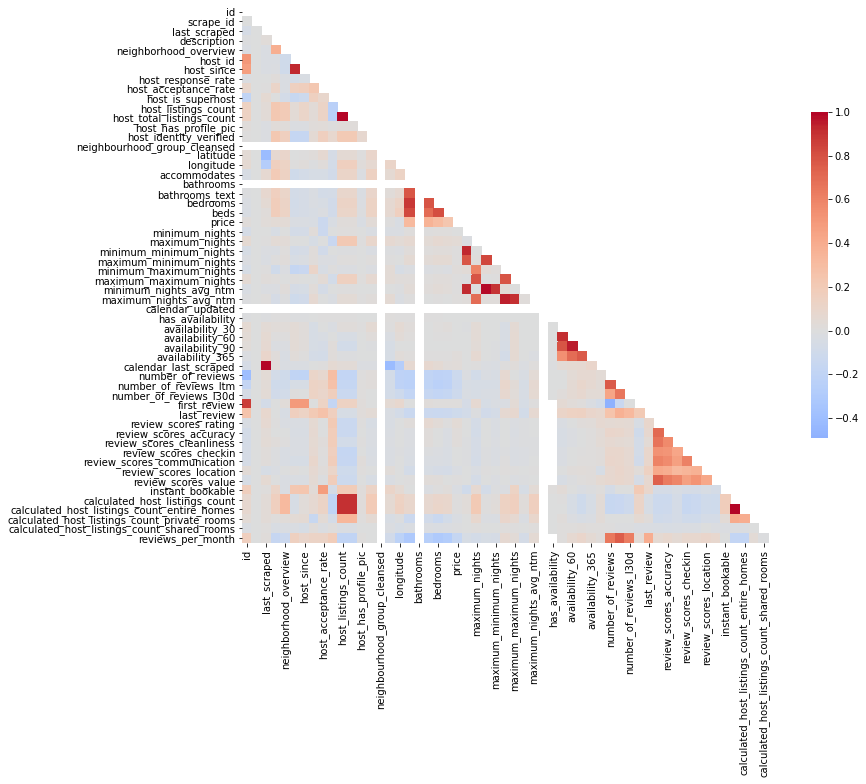

In [141]:
corr_df = df.corr() #matriz de correlación
mask = np.zeros_like(corr_df)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(corr_df, cmap='coolwarm', mask=mask, center=0, square=True, cbar_kws={"shrink": .5}, ax=ax);

Así de primeras resulta muy complicado destacar relaciones interesantes entre las variables. Se va intentar escoger aquellas variables que presenten una alta correlación para estudiarlas más en profundidad. 

In [142]:
highly_corr_df = corr_df[(np.abs(corr_df) > 0.7) & (np.abs(corr_df) < 1)] #variables con una alta correlación
highly_corr_melt_df = highly_corr_df.melt().dropna() # se reordena el df con melt() y se eliminan NaN
list_highly_corr_variables = highly_corr_melt_df['variable'].unique() #nombres de variables con mayor corr

print(list_highly_corr_variables)

['id' 'host_id' 'host_since' 'host_listings_count'
 'host_total_listings_count' 'accommodates' 'bathrooms_text' 'bedrooms'
 'beds' 'minimum_nights' 'maximum_nights' 'minimum_minimum_nights'
 'maximum_minimum_nights' 'minimum_maximum_nights'
 'maximum_maximum_nights' 'minimum_nights_avg_ntm'
 'maximum_nights_avg_ntm' 'availability_30' 'availability_60'
 'availability_90' 'availability_365' 'number_of_reviews'
 'number_of_reviews_ltm' 'first_review' 'review_scores_rating'
 'review_scores_accuracy' 'review_scores_value'
 'calculated_host_listings_count'
 'calculated_host_listings_count_entire_homes' 'reviews_per_month']


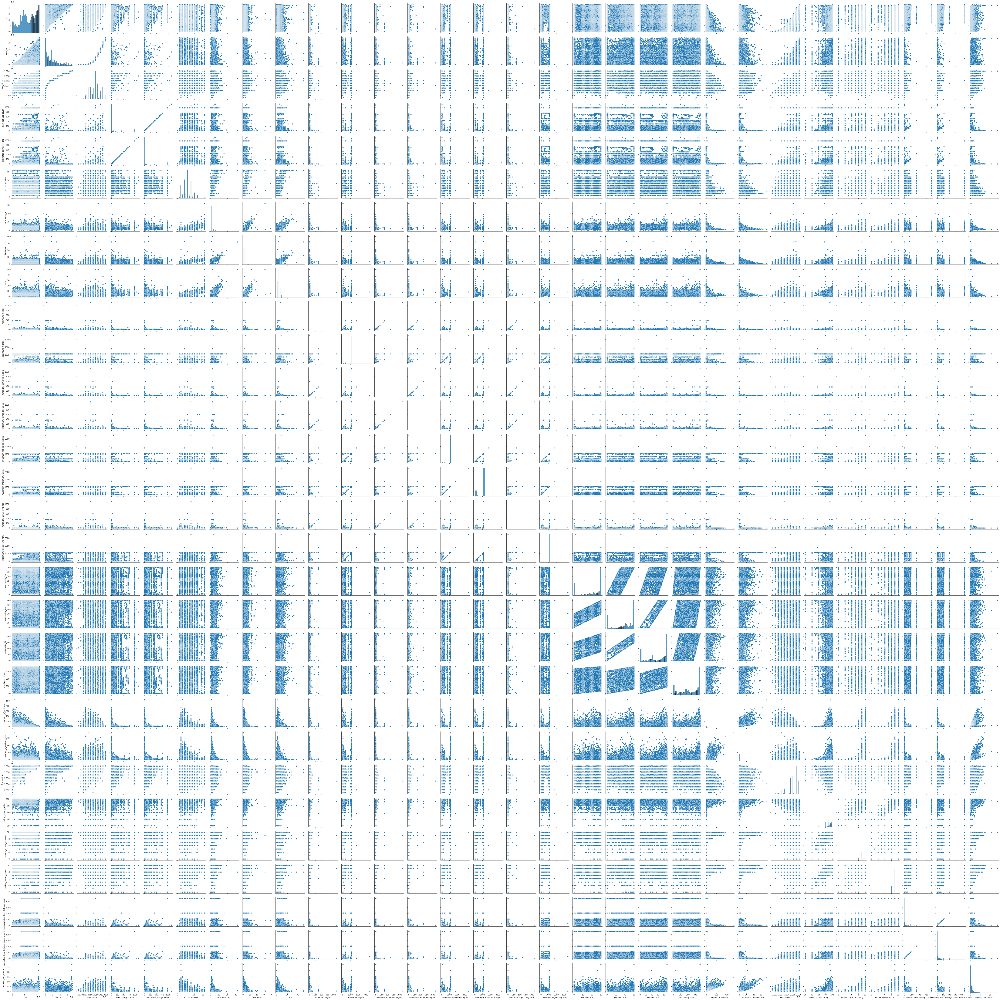

In [143]:
sns.pairplot(data=df[list_highly_corr_variables]);

De nuevo, es complicado observar correlaciones interesantes entre variables. Lo único que se puede decir es que, observando un poco los gráficos, hay variables bastante correlacionadas entre sí. Se tendrá que ir con ojo a la hora de seleccionar covariables, para que no exista una correlación alta entre ellas. 

Se procede a estudiar directamente aquellas variables mínimamente relacionadas con el objetivo. Para ello, se establece un umbral mínimo de correlación igual a 0.2

In [144]:
highly_corr_price = corr_df[['price']][(np.abs(corr_df['price']) > 0.2) & (np.abs(corr_df['price']) < 1)] #variables con una alta correlación
list_highly_corr_price = list(highly_corr_price.index)

print(list_highly_corr_price)

['accommodates', 'bathrooms_text', 'bedrooms', 'beds']


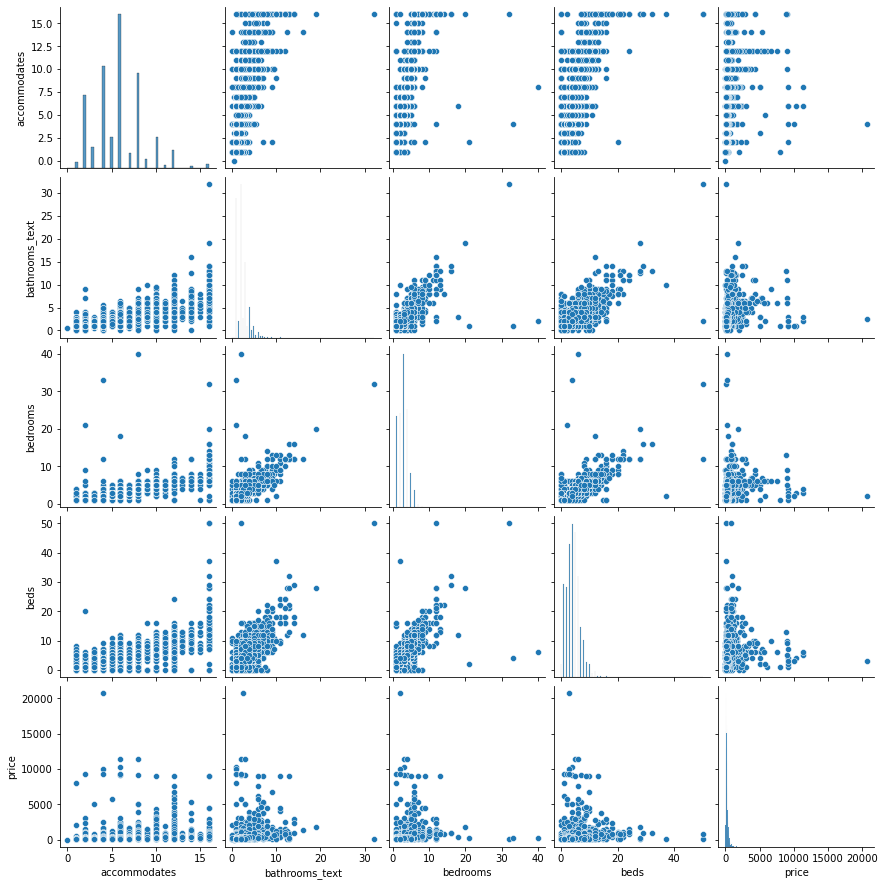

In [145]:
list_highly_corr_price.append('price')
sns.pairplot(data=df[list_highly_corr_price]);

Se procede a mostrar con mayor detalle y de una forma más cuantitativa la relación entre las variables relacionadas con el precio y las correlaciones entre ellas.

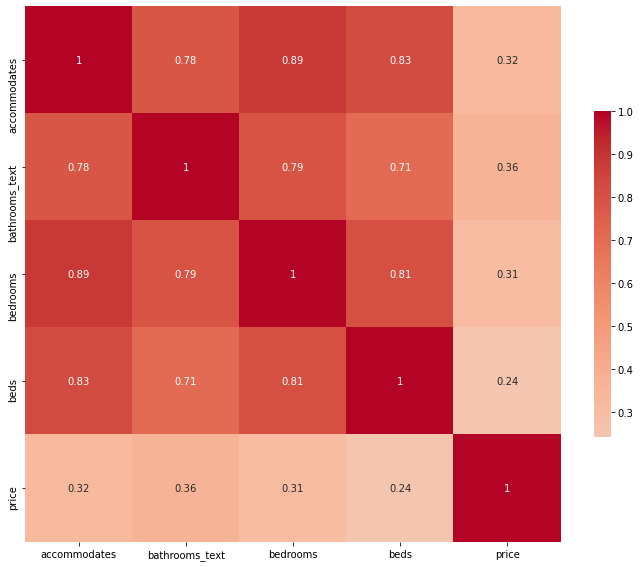

In [146]:
df_price_vars = df[list_highly_corr_price]
df_corr_price_vars = df_price_vars.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(df_corr_price_vars, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, annot = True, ax=ax);

Así pues se confirma que tiene una correlación moderada con el precio. Pero lo más importante es que están altamente correladas entre ellas. Si se quieren emplear en un modelo lineal, se tendrá que inspeccionar alguna manera de deshacer dicha correlación. 

### Análisis de variables categóricas

En este apartado se procede a estudiar la correlación de las variables categóricas con el precio. Para ello, se estudian cada una de sus columnas y la relación que tiene con la variable objetivo. Así pues, se estudia si la presencia de un determiando valor (p.e., si el propietario contenta dentro de una hora) guarda relación con el precio de la vivienda o no. 

#### `host_response_time_df`

In [147]:
host_response_time_price = host_response_time_df.join(df[['price']])
host_response_time_price.head()

,host_response_time_OHE1,host_response_time_OHE2,host_response_time_OHE3,host_response_time_OHE4,price
0,0.0,0.0,0.0,1.0,89.0
1,NaN,NaN,NaN,NaN,175.0
2,0.0,0.0,1.0,0.0,140.0
3,0.0,1.0,0.0,0.0,200.0
4,0.0,1.0,0.0,0.0,110.0


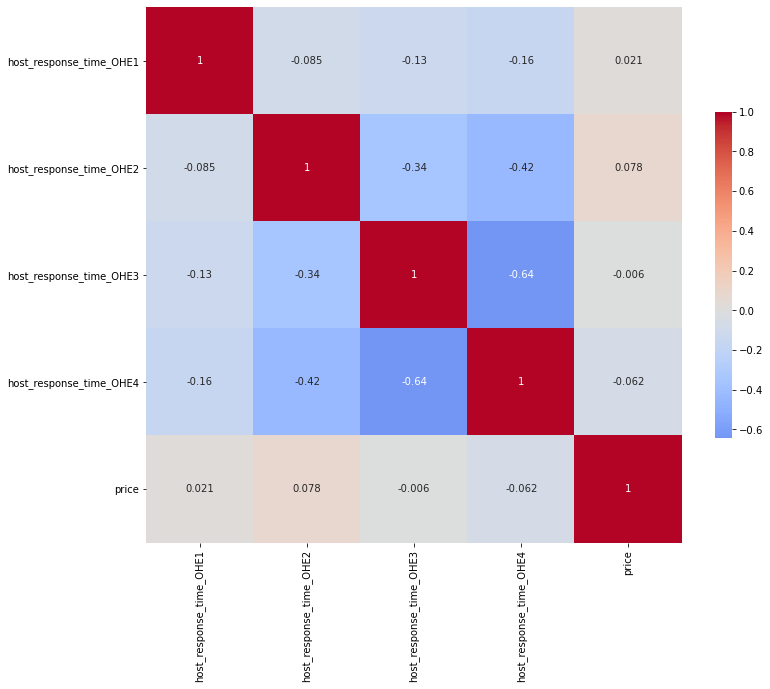

In [148]:
host_response_time_corr = host_response_time_price.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(host_response_time_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, annot = True, ax=ax);

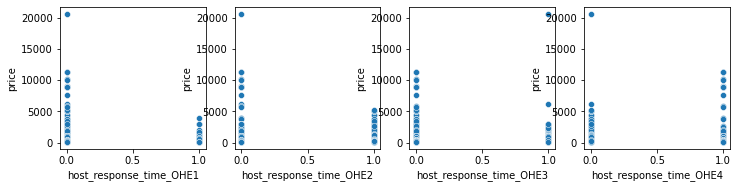

In [149]:
host_response_time_corr_col = list(host_response_time_corr.columns.values)
host_response_time_corr_col.remove('price')
plt.figure(figsize = (12,12))
for i,col in enumerate(host_response_time_corr_col):
    plt.subplot(4,4,i+1)
    sns.scatterplot(x = col, y = 'price', data = host_response_time_price[[col,'price']])

`hsot_response_time` no parece una variable que guarde una relación significativa con el precio. Ninguno de los tiempos de respuesta se correlacionan significativamente, por lo que no tiene sentido emplearla en posteriores análisis. 

#### `host_verifications_df`

In [150]:
host_verifications_price = host_verifications_df.join(df[['price']])
host_verifications_price.head()

,manual_offline,facebook,identity_manual,work_email,sent_id,manual_online,jumio,offline_government_id,government_id,kba,reviews,google,selfie,zhima_selfie,phone,email,price
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,89.0
1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,175.0
2,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,140.0
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,200.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,110.0


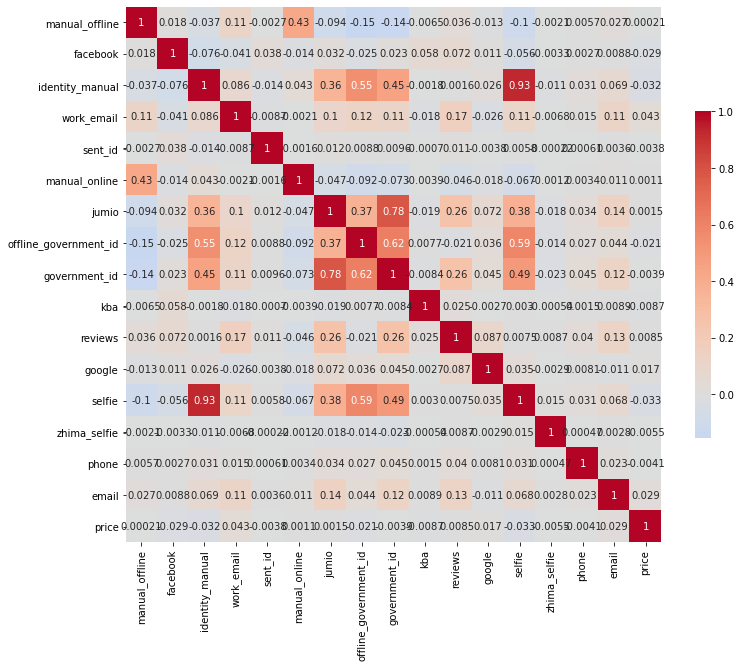

In [151]:
host_verifications_corr = host_verifications_price.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(host_verifications_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, annot = True, ax=ax);

`host_verifications` no presenta nignuna verificación de identidad que parezca guardar una relación significativa con la variable objetivo. 

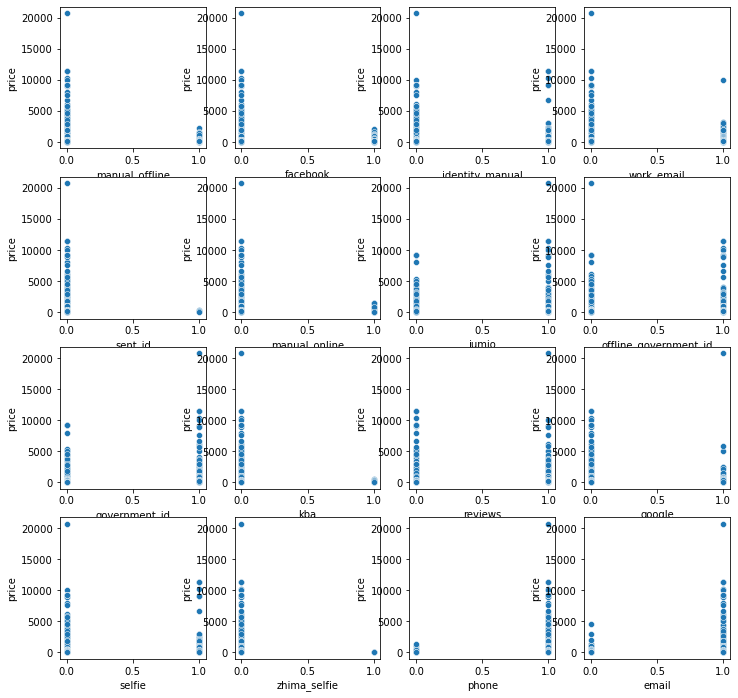

In [152]:
host_verifications_corr_col = list(host_verifications_corr.columns.values)
host_verifications_corr_col.remove('price')
plt.figure(figsize = (12,12))
for i,col in enumerate(host_verifications_corr_col):
    plt.subplot(4,4,i+1)
    sns.scatterplot(x = col, y = 'price', data = host_verifications_price[[col,'price']])

### `neighbourhood_cleansed_df`

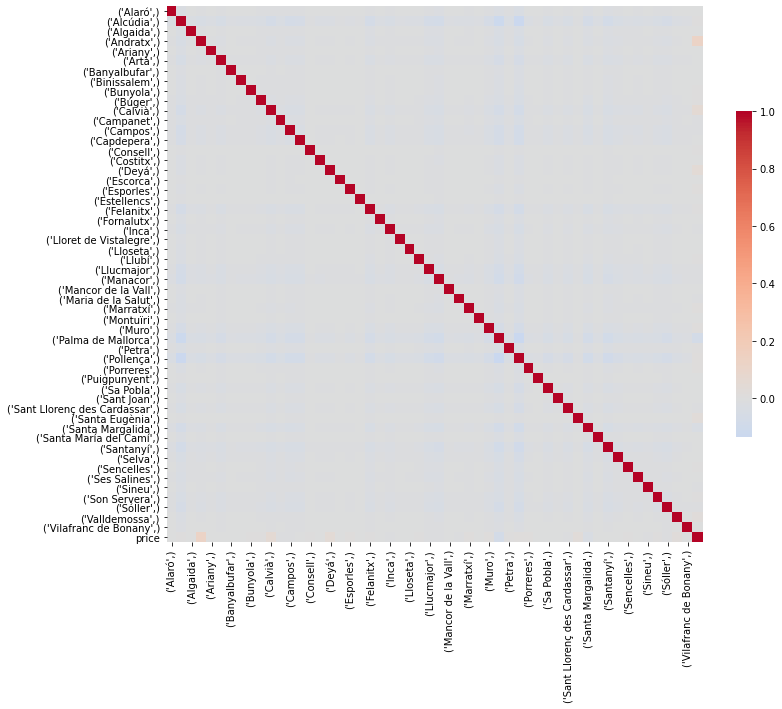

In [153]:
neighbourhood_cleansed_price = neighbourhood_cleansed_df.join(df[['price']])
neighbourhood_cleansed_corr = neighbourhood_cleansed_price.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(neighbourhood_cleansed_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, ax=ax);

Para el caso de esta variable, ya viendo los resultados de las correlaciones entre categrías, no se dispone a un análisis más profundo. No guarda relación alguna con el precio. 

#### `property_type_ohe_df`

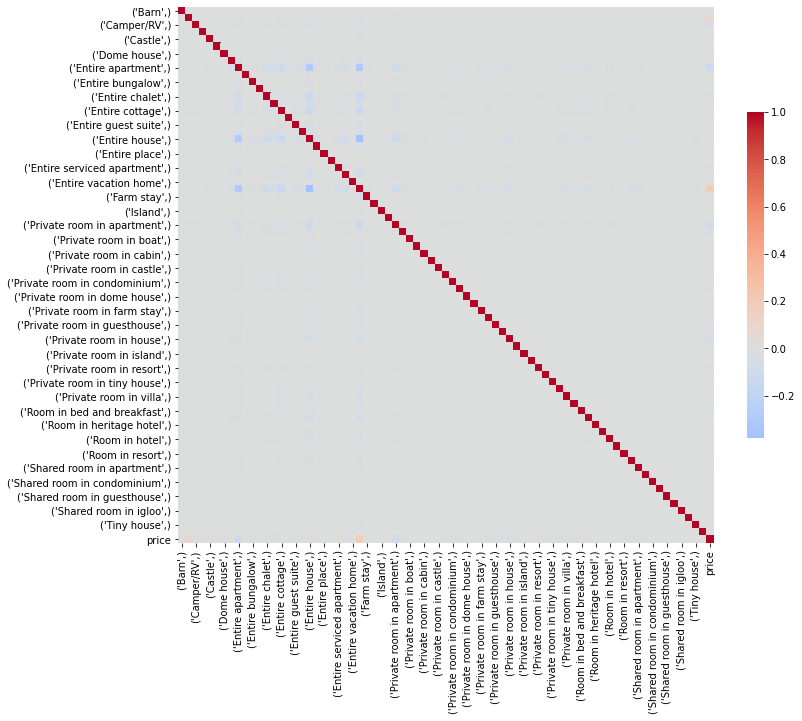

In [154]:
property_type_ohe_price = property_type_ohe_df.join(df[['price']])
property_type_ohe_corr = property_type_ohe_price.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(property_type_ohe_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, ax=ax);

Mismo caso que con la variable `neighbourhood_cleansed_df`

#### `room_type_df`

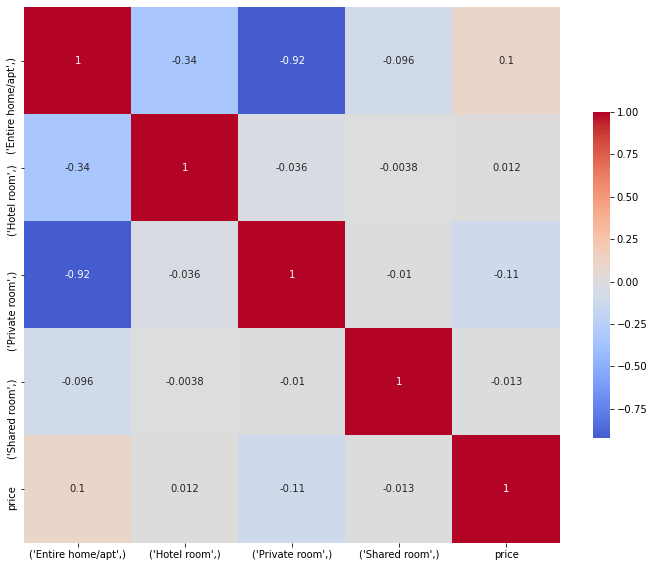

In [155]:
room_type_price = room_type_df.join(df[['price']])
room_type_corr = room_type_price.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(room_type_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, annot = True, ax=ax);

Ninguna relación significativa

#### `amenities_df`

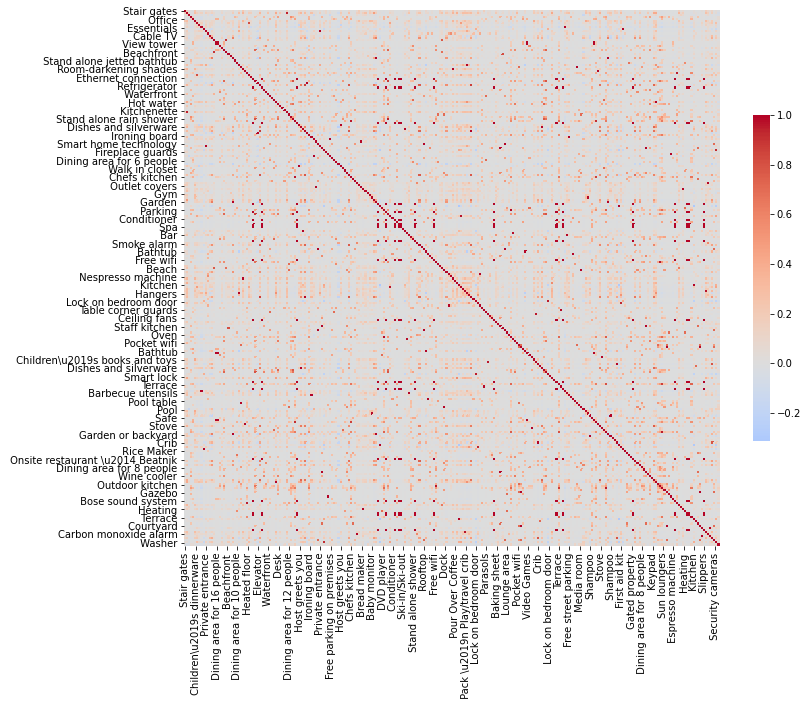

In [156]:
amenities_df_price = amenities_df.join(df[['price']])
amenities_corr = amenities_df_price.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(amenities_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, ax=ax);

Es complicado decir si existe alguna comodidad relacionada con el precio. Se comprueba de la siguiente forma:

In [157]:
highly_corr_amenities_price = amenities_corr[['price']][(np.abs(amenities_corr['price']) > 0.2) & (np.abs(amenities_corr['price']) < 1)] #variables con una alta correlación
list_highly_corr_amenities_price = list(highly_corr_amenities_price.index)

print(list_highly_corr_amenities_price)

[]


Se puede decir que no hay ningún servicio/comodidad que su presencia se relacione con el precio de alguna forma significativa. 

#### Conclusiones estudio correlación: 

Úncamente unas cuantas variables continuas se relacionas de manera más o menos significativa con el precio. En cuanto a las variables categóricas, lo más probable es que el tipo de codificación sea no apto para este estudio, o que el estudio de su correlación sea insuficiente para declarar su importancia en el problema. 

### Eliminación de _outliers_

Primero de todo, mencionar que este proceso podría haberse aplicado antes del estudio de correlación, de tal forma que se hubiese podido encontrar relaciones más significativas. Sin embargo, por cuestiones de tiempo, no ha podido ser posible y se ha dejado tal como está. 

Para la eliminación de _outliers_, se considerarán como tales aquellos valores situados a más de 3 desviaciones típicas de la media de su variable. Para ello, el primer paso será convertir todas las variables a `z-score` para definirlas como desviaciones típicas. 

In [158]:
def remove_outliers (X): 
    z_scores = stats.zscore(X)
    abs_z_scores = np.abs(z_scores)
    filtered_entries = (abs_z_scores < 3).all(axis=1) #valores por debajo de las 3 desviaciones típicas se elimina su fila entera
    return  X[filtered_entries] # dataset sin outliers

Se seleccionan solo aquellas variables continuas que guardan relación con el precio. 

In [159]:
print(list_highly_corr_price) #variables a emplear en el problema

['accommodates', 'bathrooms_text', 'bedrooms', 'beds', 'price']


In [160]:
ds_orig = df[list_highly_corr_price] #variables que tienen cierta correlación con el precio + el precio
ds_filt = remove_outliers(ds_orig)
ds_filt.head()

,accommodates,bathrooms_text,bedrooms,beds,price


Se devuelve un conjunto vacío. Se procede a examinar por qué. 

In [161]:
z_scores = stats.zscore(ds_orig)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3)
filtered_entries

array([[ True,  True, False, False,  True],
       [ True,  True, False, False,  True],
       [ True,  True, False, False,  True],
       ...,
       [ True,  True, False, False,  True],
       [ True,  True, False, False,  True],
       [ True,  True, False, False,  True]])

Se aprecia que las variables `bedrooms` y `beds` tienen un comportamiento anómalo cuando se tratan los _outliers_. 

In [162]:
ds_orig.head()

,accommodates,bathrooms_text,bedrooms,beds,price
0,2,1.0,1.0,1.0,89.0
1,8,3.0,4.0,7.0,175.0
2,6,2.0,3.0,4.0,140.0
3,4,1.0,2.0,4.0,200.0
4,2,1.0,1.0,2.0,110.0


Cuando se observan la media y desviación estándar de las estas variables, no tiene sentido que devuelva los valores observados previamente. Es decir, no tiene sentido que establezca como `False` las 3 primers observaciones cuando estas no se encuentran a más de 3 desviaciones típicas de la media. Esto se puede apreciar fácilmente si se observan los valores impresos a continuación.

In [163]:
print('Mean bedrooms: ', ds_orig['bedrooms'].mean())
print('STD bedrooms: ', ds_orig['bedrooms'].std())
print('Mean beds: ', ds_orig['beds'].mean())
print('STD beds: ', ds_orig['beds'].std())

Mean bedrooms:  2.952979864997404
STD bedrooms:  1.520433153349437
Mean beds:  4.3571469362115245
STD beds:  2.5618383232691926


Así pues, se observa que el problema es que cuando se calcula el `z-score`, la presencia de `NaN` en las osbervaciones de estas variables produce un efecto indeseado.

In [164]:
z_scores = stats.zscore(ds_orig)
abs_z_scores = np.abs(z_scores)
pd.DataFrame(data = abs_z_scores)

,0,1,2,3,4
0,1.414385,0.945999,NaN,NaN,0.379034
1,0.785302,0.521559,NaN,NaN,0.169250
2,0.052073,0.212220,NaN,NaN,0.254627
3,0.681156,0.945999,NaN,NaN,0.108267
4,1.414385,0.945999,NaN,NaN,0.327808
...,...,...,...,...,...
17603,0.052073,0.888448,NaN,NaN,0.120463
17604,1.151917,0.521559,NaN,NaN,0.327808
17605,0.052073,0.212220,NaN,NaN,0.159493
17606,1.414385,0.945999,NaN,NaN,0.493683


In [165]:
print('Number of NaNs in bedrooms: ',ds_orig['bedrooms'].isna().sum())
print('NUmebr of NaNs in beds: ', ds_orig['beds'].isna().sum())

Number of NaNs in bedrooms:  275
NUmebr of NaNs in beds:  97


No suponen una cantidad considerable de NaNs. Si se suman ambos, no llega al 3% del total de osbervaciones. Con esto, es racional eliminarlo directamente en lugar de volver a tratarlos. 

In [166]:
ds_orig = ds_orig.dropna()
ds_orig.shape

(17244, 5)

In [167]:
ds_filt = remove_outliers(ds_orig)
ds_filt.head()

,accommodates,bathrooms_text,bedrooms,beds,price
0,2,1.0,1.0,1.0,89.0
1,8,3.0,4.0,7.0,175.0
2,6,2.0,3.0,4.0,140.0
3,4,1.0,2.0,4.0,200.0
4,2,1.0,1.0,2.0,110.0


#### Se vuelve a comprobar la correlación, ahora sin _outliers_

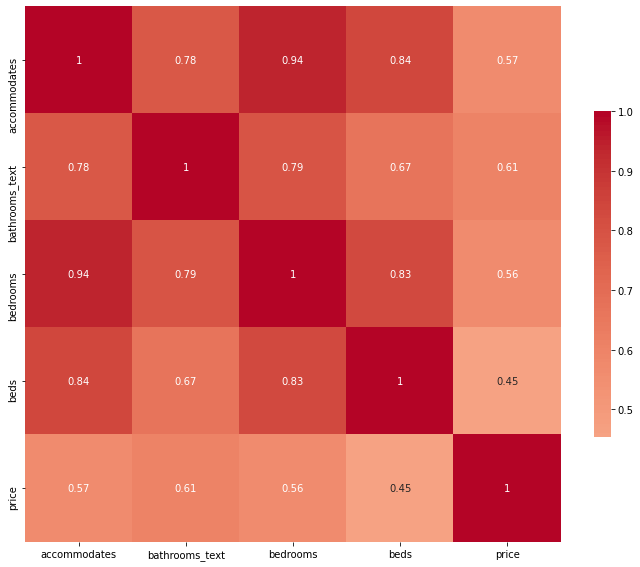

In [168]:
ds_filt_corr = ds_filt.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(ds_filt_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, annot = True, ax=ax);

Se comprueba que la eliminación de _outliers_ mejora la correlación en la variable ojetivo y las variables independientes.

#### Hisotgramas 

Se realiza una pequeña demostración visual del resultado de quitar _outliers_ con el uso de histogramas.

<AxesSubplot:title={'center':'price w/o outliers'}, ylabel='Frequency'>

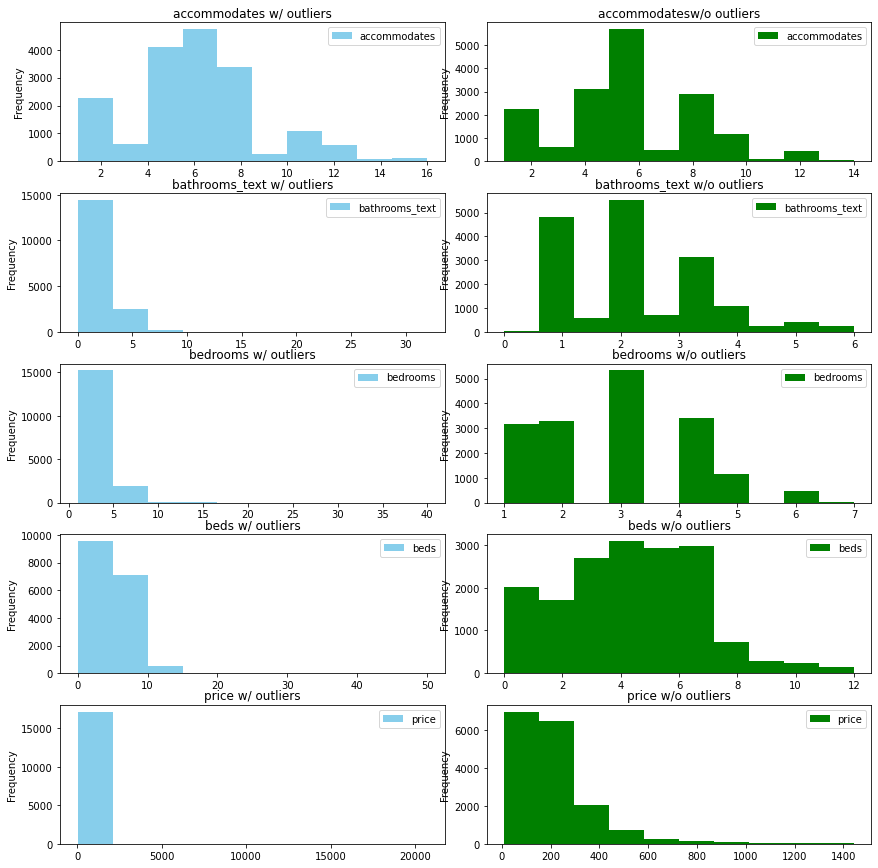

In [169]:
# HISTOGRAMAS
fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(5,2, figsize = (12,12))
fig.tight_layout()
colnames = list(ds_orig.columns.values)

ds_orig[[colnames[0]]].plot.hist(bins = 10, color = "skyblue", title = colnames[0] + " w/ outliers", ax = ax1[0])
ds_filt[[colnames[0]]].plot.hist(bins = 10, color = "green", title = colnames[0] + "w/o outliers", ax = ax1[1])

ds_orig[[colnames[1]]].plot.hist(bins = 10, color = "skyblue", title = colnames[1] + " w/ outliers", ax = ax2[0])
ds_filt[[colnames[1]]].plot.hist(bins = 10, color = "green", title = colnames[1] + " w/o outliers", ax = ax2[1])

ds_orig[[colnames[2]]].plot.hist(bins = 10, color = "skyblue", title = colnames[2] + " w/ outliers", ax = ax3[0])
ds_filt[[colnames[2]]].plot.hist(bins = 10, color = "green", title = colnames[2] + " w/o outliers", ax = ax3[1])

ds_orig[[colnames[3]]].plot.hist(bins = 10, color = "skyblue", title = colnames[3] + " w/ outliers", ax = ax4[0])
ds_filt[[colnames[3]]].plot.hist(bins = 10, color = "green", title = colnames[3] + " w/o outliers", ax = ax4[1])

ds_orig[[colnames[4]]].plot.hist(bins = 10, color = "skyblue", title = colnames[4] + " w/ outliers", ax = ax5[0])
ds_filt[[colnames[4]]].plot.hist(bins = 10, color = "green", title = colnames[4] + " w/o outliers", ax = ax5[1])

Se puede aprecias como el rango de la variable estudiada en mucho mayor en aquellos histogramas que incluyen los _outliers_. Esto es indicativo de algunos valores espóradicos muy elevados. No es de extrañar pues que las correlaciones entre variables hayan mejorado. 

#### Boxplots

A continuación se realiza otra inspección visual de la eliminación de _outliers_, pero ahora con los boxplots. Quizá de esta forma sea más sencillo observar tales valores.

Text(0.5, 1.0, 'accommodates')

<Figure size 432x288 with 0 Axes>

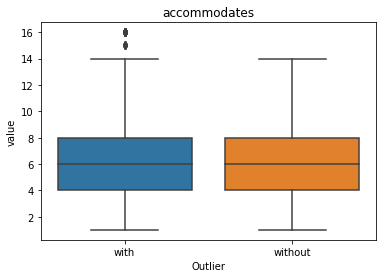

In [170]:
plt.clf()
fig, ax = plt.subplots()

data1 = pd.concat([ds_orig[[colnames[0]]].assign(Outlier="with"), ds_filt[[colnames[0]]].assign(Outlier="without")])
data1_melt = pd.melt(data1, id_vars = ['Outlier'], var_name = colnames[0])
ax = sns.boxplot(x="Outlier", y="value", data=data1_melt) 
ax.set_title(colnames[0])

<Figure size 432x288 with 0 Axes>

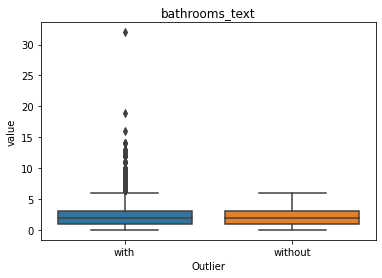

In [171]:
plt.clf()
fig, ax = plt.subplots()

data2 = pd.concat([ds_orig[[colnames[1]]].assign(Outlier="with"), ds_filt[[colnames[1]]].assign(Outlier="without")])
data2_melt = pd.melt(data2, id_vars = ['Outlier'], var_name = colnames[1])
ax = sns.boxplot(x="Outlier", y="value", data=data2_melt) 
ax.set_title(colnames[1])
plt.show();

<Figure size 432x288 with 0 Axes>

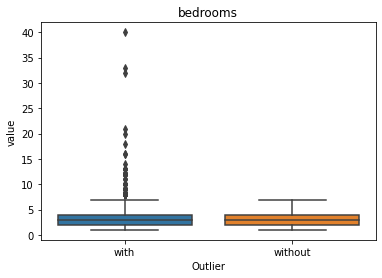

In [172]:
plt.clf()
fig, ax = plt.subplots()

data3 = pd.concat([ds_orig[[colnames[2]]].assign(Outlier="with"), ds_filt[[colnames[2]]].assign(Outlier="without")])
data3_melt = pd.melt(data3, id_vars = ['Outlier'], var_name = colnames[2])
ax = sns.boxplot(x="Outlier", y="value", data=data3_melt) 
ax.set_title(colnames[2])
plt.show();

<Figure size 432x288 with 0 Axes>

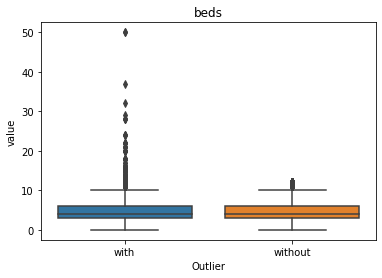

In [173]:
plt.clf()
fig, ax = plt.subplots()

data4 = pd.concat([ds_orig[[colnames[3]]].assign(Outlier="with"), ds_filt[[colnames[3]]].assign(Outlier="without")])
data4_melt = pd.melt(data4, id_vars = ['Outlier'], var_name = colnames[3])
ax = sns.boxplot(x="Outlier", y="value", data=data4_melt) 
ax.set_title(colnames[3])
plt.show();

<Figure size 432x288 with 0 Axes>

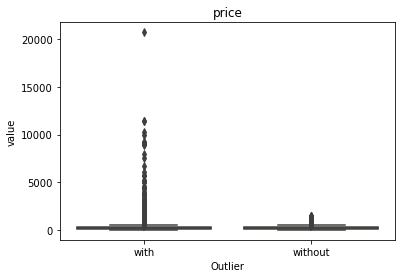

In [174]:
plt.clf()
fig, ax = plt.subplots()

data5 = pd.concat([ds_orig[[colnames[4]]].assign(Outlier="with"), ds_filt[[colnames[4]]].assign(Outlier="without")])
data5_melt = pd.melt(data5, id_vars = ['Outlier'], var_name = colnames[4])
ax = sns.boxplot(x="Outlier", y="value", data=data5_melt) 
ax.set_title(colnames[4])
plt.show()

### Principal Component Analysis

A continuación se plantea un PCA. En este caso no es para conseguir una reducción de la dimensionalidad, ya que de por si se tienen pocas variables, sino que se busca conseguir variables linealmente independientes. Esto último esta grantizado ya que las nuevas variables son combinaciones lineales de los elementos de los autovectores de la matriz de covarianzas de las variables originales. Como los autovectores son linealmente independientes, estas variables finales también los serán. 

In [175]:
from sklearn.decomposition import PCA

In [176]:
price = ds_filt[['price']]
ds_pca = ds_filt.drop('price', axis = 1)

In [177]:
pca = PCA(random_state = 42) #n_components = todos
pca.fit(ds_pca)

pca.components_ 

array([[ 0.68569679,  0.25532995,  0.34766108,  0.58630905],
       [ 0.48028667,  0.30102326,  0.18537105, -0.80271246],
       [ 0.42583361, -0.8999397 , -0.02841514, -0.08925726],
       [ 0.34323515,  0.18520302, -0.918674  ,  0.06267016]])

Se muestra gráficamente la varianza explicada por cada componente. 

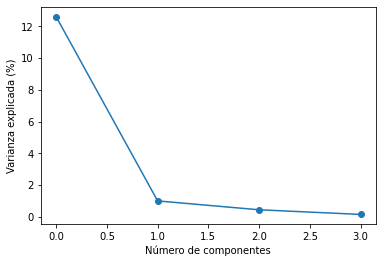

In [178]:
x = np.linspace(0, pca.n_components_ -1 , num = pca.n_components_)
plt.scatter(x, pca.explained_variance_)
plt.plot(pca.explained_variance_)
plt.xlabel('Número de componentes')
plt.ylabel('Varianza explicada (%)')
plt.show();

La varianza acumulada explicada por las 4 componentes es muy baja. Sin emabargo, se probarán a ver que tal funcionan con los modelos.

In [179]:
ds_pca_fit = pca.fit_transform(ds_pca)

In [180]:
df_pca = pd.DataFrame(data = ds_pca_fit, columns = ['PCA1', 'PCA2', 'PCA3', 'PCA4'])
#df_pca_price = df_pca.join(price)
df_pca.head()

,PCA1,PCA2,PCA3,PCA4
0,-5.438177,0.100980,-0.167592,-0.007025
1,3.747501,-0.675415,-0.033259,0.042791
2,0.014189,0.285754,0.311201,-0.098219
3,-1.960196,-1.161213,0.387888,-0.051218
4,-4.851868,-0.701733,-0.256849,0.055645


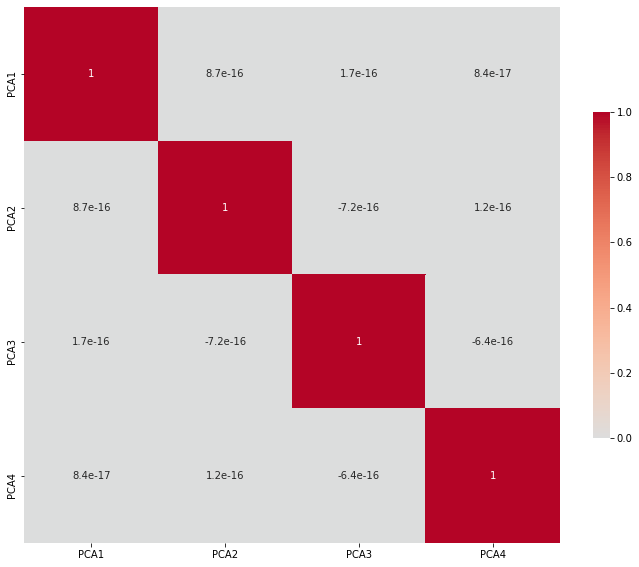

In [181]:
df_pca_corr = df_pca.corr()
f, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(df_pca_corr, cmap='coolwarm', center=0, square=True, cbar_kws={"shrink": .5}, annot = True, ax=ax);

#### Observaciones PCA

Como ya se había comentado, lo que se consigue son **variables linealmente independientes**. Sin embargo, **se pierde toda correlación** con el `precio`. Esto tendrá consecuencias sobre las estimaciones realizadas por los modelos.

## Modelos

En esta última sección, se plantean una serie de modelos, desde el más sencillo (una regresión lineal) hasta uno más complejo (Random Forest). De esta forma se podrán comparar los resultados. El desempeño de cada modelo se medirá tanto en el conjunto de entrenamiento como en el de test. Aquellos modelos que presenten hiperparámetros, se evaluará la mejor combinación de estos por medio de un Grid Search. El entrenamiento de los modelos será evaluado por medio de validación cruzada.

### Métrica seleccionada para la evaluación

Se ha escogido el MAE ( _mean absolute error_ ). Se ha seleccionado esta opción por dos motivos: 
1. Se expresa en las mismas unidades que la variable objetivo, dotando de una buena interpretabilidad a dicha métrica. 
2. Al haberse excluido los _outliers_ del conjunto de datos, no es necesario emplear métricas como MSE o RMSE las cuales penalizan dichos valores. 

In [182]:
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
from sklearn.metrics import mean_absolute_error

# Se almacenan las variables predictoras y objetivo
X = ds_pca_fit
y = price.to_numpy()

### Regresión lineal

Para el caso de la regresión lineal, esta se evaluará por medio de la validación cruzada empleando el conjunto entero de datos. No es necesario reservar un conjunto de test para evaluar su rendimiento posteriormente. Esto tiene sentido cuando la validación cruzada busca, por ejemplo, evaluar modelo con distintos hiperparámetros, donde la inclusión del grupo de testeo sesgaría la selección de estos y por consiguiente los resultados sobre dicho grupo.

In [183]:
from sklearn.linear_model import LinearRegression

reg_LR = LinearRegression()

LR_scores = cross_val_score(estimator=reg_LR, X= X, y = y, cv=10, scoring= 'neg_mean_absolute_error')

print('MAE para LR: {m} +- {s} €'.format(m=-round(LR_scores.mean(), 2),
                                       s=round(LR_scores.std(),2)))

print ('Error cometido (%): {}'.format((-round(LR_scores.mean(), 2) / y.mean()) * 100))

MAE para LR: 80.61 +- 4.54 €
Error cometido (%): 37.368725110704126


Como ya se ha comentado, la selección del MAE permite una buena interpretación de los errores cometidos, empleando las mismas unidades que el precio. Esto también es así con el RMSE. 


Dicho esto, se comente un error significativo sobre aquellos grupos de valiación. A ver si con modelos más complejos puede obtenerse un mejor resultado. 

### División del conjunto en entrenamiento y test

In [184]:
test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(ds_pca_fit, np.ravel(y), test_size=test_size, random_state=42)

### Decision Tree

#### Grid Search para la búsqueda de los mejores hiperparámetros

Hiperparámetro a evaluar: profundidad del árbol.

In [185]:
from sklearn.tree import DecisionTreeRegressor

# Este modelo se evaluará con GridSearch
params = {'max_depth': range(1, 10)}

reg_DT = DecisionTreeRegressor()

gs_reg_DT = GridSearchCV(estimator=reg_DT,
                         param_grid=params,
                         cv=10,
                         scoring='neg_mean_absolute_error')

gs_reg_DT.fit(X_train, y_train)
print('Profundidad más adecuada: ', gs_reg_DT.best_params_)
print('MAE (training) para DR: {m} +- {s} €'.format(m = -gs_reg_DT.cv_results_['mean_test_score'].max(),
                                       s= gs_reg_DT.cv_results_['std_test_score'].max()))
print ('Error cometido en el entrenamiento(%): {}'.format((-gs_reg_DT.cv_results_['mean_test_score'].max() / y.mean()) * 100))

Profundidad más adecuada:  {'max_depth': 6}
MAE (training) para DR: 80.20549657462868 +- 3.1694507870107285 €
Error cometido en el entrenamiento(%): 37.18120771448729


In [186]:
DT_results = pd.DataFrame(data = gs_reg_DT.cv_results_)
DT_results.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.003406,0.001303,0.000616,0.000172,1,{'max_depth': 1},-95.176674,-90.249943,-96.436608,-93.915055,-92.720091,-95.197820,-90.392792,-100.611310,-96.593610,-93.374238,-94.466814,2.934711,9
1,0.003689,0.000367,0.000437,0.000029,2,{'max_depth': 2},-86.719817,-82.528283,-88.098050,-86.956261,-85.948907,-89.102825,-82.884395,-94.193649,-89.410012,-87.546143,-87.338834,3.169451,8
2,0.004929,0.000532,0.000492,0.000174,3,{'max_depth': 3},-83.127185,-79.198809,-82.871383,-82.959600,-81.931624,-83.438333,-79.587485,-87.905402,-84.778535,-83.309852,-82.910821,2.338907,7
3,0.005761,0.000185,0.000446,0.000024,4,{'max_depth': 4},-82.295641,-77.244837,-80.642991,-79.630986,-80.171633,-81.240099,-78.111381,-86.149025,-82.558718,-81.854929,-80.990024,2.377846,6
4,0.006621,0.000065,0.000467,0.000028,5,{'max_depth': 5},-81.780230,-77.660694,-81.694212,-78.548990,-79.770127,-80.472529,-76.506166,-85.109409,-81.259818,-80.561110,-80.336328,2.301678,4
5,0.007504,0.000252,0.000467,0.000025,6,{'max_depth': 6},-82.423326,-77.176716,-80.435933,-78.432782,-80.748123,-79.621163,-75.614375,-84.630827,-81.767074,-81.204646,-80.205497,2.490433,1
6,0.008151,0.000042,0.000462,0.000009,7,{'max_depth': 7},-82.184840,-77.468407,-79.619478,-79.025223,-81.022314,-79.519873,-75.727884,-84.316576,-82.262037,-81.016259,-80.216289,2.368939,2
7,0.008922,0.000098,0.000470,0.000008,8,{'max_depth': 8},-81.415103,-77.966427,-79.275976,-79.587360,-81.125752,-78.571571,-75.899096,-84.842655,-82.539698,-81.602838,-80.282648,2.421345,3
8,0.009668,0.000099,0.000544,0.000062,9,{'max_depth': 9},-81.451503,-78.630516,-80.134088,-80.578893,-81.634153,-79.682543,-77.920429,-85.338216,-82.857477,-81.357123,-80.958494,2.018606,5


#### Evaluación con el conjunto de test

Se entrena el modelo con el hiperparámetro óptimo y se evalúa sobre el conjunto de test.

In [187]:
reg_DT_final = DecisionTreeRegressor(max_depth = 6)
reg_DT_final.fit(X_train, y_train)
predictions_DT = reg_DT_final.predict(X_test)
mae_DT = mean_absolute_error(y_test, predictions_DT)

print('MAE sobre el conjunto de test para DT: ', mae_DT)
print ('Error cometido (%): ', mae_DT/y_test.mean() * 100)

MAE sobre el conjunto de test para DT:  82.09652319380004
Error cometido (%):  38.32105800455666


#### Conclusiones sobre el Decision Tree

No parece que un modelo más complejo ayude a obtener mejores resultados. Ni en el entrenamiento ni el testeo. Es más, resulta curioso que un modelo tan apto de cometer _overfitting_ no lo haga, ya que los resultados tante del entrenamiento como el test son bastante parecidos.

### Random Forest

#### Gris Search para evaluación de hiperparámetros. 

Hiperparámetros a evaluar: número de Decision Trees empleados y profundidad de estos. 

In [188]:
from sklearn.ensemble import RandomForestRegressor

params = {'n_estimators': range(100, 151), 
          'max_depth': range(1, 10)} 

reg_RF = RandomForestRegressor(bootstrap = True, max_samples = 0.3)

gs_reg_RF = GridSearchCV(estimator=reg_RF,
                         param_grid=params,
                         cv=10,
                         scoring='neg_mean_absolute_error')

gs_reg_RF.fit(X_train, y_train) 

GridSearchCV(cv=10, estimator=RandomForestRegressor(max_samples=0.3),
             param_grid={'max_depth': range(1, 10),
                         'n_estimators': range(100, 151)},
             scoring='neg_mean_absolute_error')

In [189]:
print('Profundidad más adecuada: ', gs_reg_RF.best_params_)
print('MAE para DR: {m} +- {s} €'.format(m = -gs_reg_RF.cv_results_['mean_test_score'].max(),
                                       s= gs_reg_RF.cv_results_['std_test_score'].max()))
print ('Error cometido (%): {}'.format((-gs_reg_RF.cv_results_['mean_test_score'].max() / y.mean()) * 100))

Profundidad más adecuada:  {'max_depth': 6, 'n_estimators': 127}
MAE para DR: 78.7816194761414 +- 3.136293401726078 €
Error cometido (%): 36.52113487135619


#### Evaluación sobre el conjunto de test

Se entrena el modelo con el conjunto de hiperparámetros óptimo y se evalúa con el conjunto de test

In [190]:
reg_RF_final = RandomForestRegressor(n_estimators = 122, max_depth = 6, bootstrap = True, max_samples = 0.3)
reg_RF_final.fit(X_train, y_train)
predictions_RF = reg_RF_final.predict(X_test)
mae_RF = mean_absolute_error(y_test, predictions_RF)

print('MAE sobre el conjunto de test para DT: ', mae_RF)
print ('Error cometido (%): ', mae_RF/y_test.mean() * 100)

MAE sobre el conjunto de test para DT:  80.20505636525866
Error cometido (%):  37.4381581297456


#### Conclusiones sobre el Random Forest

De nuevo, se observa únicamente una ligera mejora respecto de los modelos anteriores. Sin embargo, parece seguir habiendo un gran error en las estimaciones.

## Conclusiones y observaciones generales 

El dataset original se trata un dataset voluminoso y muy sucio. Durante el preprocesado, cabe mencionar que las transformaciones OHE aplicadas a ciertas variables categóricas no ha sido la más apropiada por su cantidad de niveles o factores. Esto ha podido influir en las bajas correlaciones con el precio, además de los propios métodos empleados para evaluar dichas correlaciones. Está claro que algunas de estas variables pueden resultar de gran interés para predecir un precio de una casa, como su localización, el tipo de vivienda o habitación. No obstante, se han tenido que descartar. 

Por otra parte, la eliminación de _outliers_ quizá debería haberse hecho antes del estudio de correlaciones, descubriendo relaciones más interesantes que las actuales (con un poco de suerte). 

El análisis de componentes principales efectivamente ha dado variables linealmente dependientes, lo cual es bueno para modelos lineales. Sin embargo, se ha perdido toda correlación con la variable objetivo. Por otro lado, se debería haber probado con las variables sin transformar y evaluar su efecto, especialmente en los dos últimos modelos no lineales. 

Finalmente se concluye que la mayor lacra en este ejercicio pueden ser las variables seleccionadas finalmente. Un mejor tratamiento de los datos podría haber dado a luz a modelos más interesantes. 